In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import tensorflow as tf
import matplotlib.pyplot as plt
import sklearn.preprocessing
from sklearn.metrics import r2_score
from sklearn.preprocessing import MinMaxScaler, StandardScaler

from keras.layers import Dense,Dropout,LSTM, GRU, SimpleRNN
from keras.layers import TimeDistributed
from keras.layers import Flatten
from keras.layers.convolutional import Conv1D
from keras.layers import ConvLSTM2D
from keras.layers.convolutional import MaxPooling1D
from keras.models import Sequential
from keras.losses import mean_squared_error
from keras.backend import sign
import math

2022-04-23 18:54:24.816676: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-04-23 18:54:24.816701: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


# Data Processing

In [2]:
df = pd.read_csv('weatherHistory.csv')
df.head()

,Formatted Date,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars),Daily Summary
0,2006-04-01 00:00:00.000 +0200,Partly Cloudy,rain,9.472222,7.388889,0.89,14.1197,251.0,15.8263,0.0,1015.13,Partly cloudy throughout the day.
1,2006-04-01 01:00:00.000 +0200,Partly Cloudy,rain,9.355556,7.227778,0.86,14.2646,259.0,15.8263,0.0,1015.63,Partly cloudy throughout the day.
2,2006-04-01 02:00:00.000 +0200,Mostly Cloudy,rain,9.377778,9.377778,0.89,3.9284,204.0,14.9569,0.0,1015.94,Partly cloudy throughout the day.
3,2006-04-01 03:00:00.000 +0200,Partly Cloudy,rain,8.288889,5.944444,0.83,14.1036,269.0,15.8263,0.0,1016.41,Partly cloudy throughout the day.
4,2006-04-01 04:00:00.000 +0200,Mostly Cloudy,rain,8.755556,6.977778,0.83,11.0446,259.0,15.8263,0.0,1016.51,Partly cloudy throughout the day.


In [3]:
df = df[['Wind Speed (km/h)']]
df.describe()

,Wind Speed (km/h)
count,96453.000000
mean,10.810640
std,6.913571
min,0.000000
25%,5.828200
50%,9.965900
75%,14.135800
max,63.852600


In [4]:
data = df.to_numpy()
data.shape

(96453, 1)

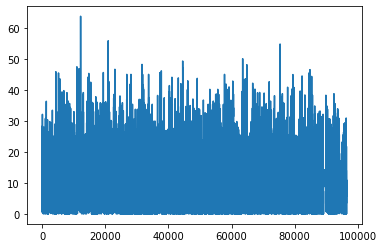

In [5]:
x = np.arange(data.shape[0])
plt.plot(x, data)

In [6]:
total_timesteps= 24
train_time_steps = 23
test_time_steps = total_timesteps - train_time_steps

In [7]:
data.shape[0]

96453

In [8]:
daily_data = []  
for i in range(0, data.shape[0], total_timesteps):
    daily_data.append(data[i:i+total_timesteps]) 
print(np.array(daily_data).shape)

(4019,)


/tmp/ipykernel_6250/1973323311.py:4: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  print(np.array(daily_data).shape)


In [9]:
train_test_ratio=0.9
batch_size = 128

In [10]:
length = int(len(daily_data)*train_test_ratio)
# random.shuffle(daily_data)
print(len(daily_data), length)
train_data = daily_data[0:length]
test_data= daily_data[length:-1]
train_data = np.array(train_data)
test_data = np.array(test_data)
print("Train and Test Data shapormalizing/standardizing:", train_data.shape, test_data.shape)

4019 3617
Train and Test Data shapormalizing/standardizing: (3617, 24, 1) (401, 24, 1)


**Train, Validate, Test Splits**

In [11]:
scaler=MinMaxScaler(feature_range=(0,1))
train_data=scaler.fit_transform(train_data.reshape(-1,1))
# # 
# scaler=StandardScaler()
# train_data=scaler.fit_transform(train_data.reshape(-1,1))

train_data = train_data.reshape(-1,total_timesteps)
print("Train Data shape after normalizing/standardizing:", train_data.shape)

test_data=scaler.transform(test_data.reshape(-1,1))

test_data = test_data.reshape(-1,total_timesteps)
print("Train and Test Data shape before normalizing/standardizing:", train_data.shape, test_data.shape)

print("Before Validation Data: train vs test", train_data.shape, test_data.shape)

length = int(len(train_data)*train_test_ratio)
# random.shuffle(train_data)
val_data= train_data[length:]
train_data = train_data[0:length]
print("After Validation Data (from train data): train vs validation vs test", train_data.shape, val_data.shape, test_data.shape)

Train Data shape after normalizing/standardizing: (3617, 24)
Train and Test Data shape before normalizing/standardizing: (3617, 24) (401, 24)
Before Validation Data: train vs test (3617, 24) (401, 24)
After Validation Data (from train data): train vs validation vs test (3255, 24) (362, 24) (401, 24)


**Data Preprocessing**

In [12]:
def create_X_data(dataset, time_step=1):
    dataX = []
    for i in range(len(dataset)):
        X_data = dataset[i][0:time_step]
        dataX.append(X_data)
    return np.array(dataX)

def ready_X_data(train_data, val_data, test_data, train_time_steps):
      X_train = create_X_data(train_data, train_time_steps)
      X_val = create_X_data(val_data, train_time_steps)
      X_test = create_X_data(test_data, train_time_steps) 
      # reshape input to be [samples, time steps, features] which is required for LSTM
      X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
      X_val =X_val.reshape(X_val.shape[0],X_val.shape[1] , 1)
      X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)
      
     
      return X_train, X_val , X_test
def create_y_data(dataset, time_step=1):
    dataY = []
    for i in range(len(dataset)):
        y_data = np.max(dataset[i][time_step:])
        dataY.append(y_data)
    return np.array(dataY)

def ready_y_data(train_data, val_data, test_data, train_time_steps):
      y_train = create_y_data(train_data, train_time_steps)
      y_val = create_y_data(val_data, train_time_steps)
      y_test = create_y_data(test_data, train_time_steps )
      y_train =y_train.reshape(-1 , 1)
      y_val =y_val.reshape(-1 , 1)
      y_test = y_test.reshape(-1, 1)

      return y_train.reshape(-1) , y_val.reshape(-1), y_test.reshape(-1) 

In [13]:
X_train, X_val, X_test = ready_X_data(train_data, val_data, test_data, train_time_steps)
y_train , y_val, y_test  = ready_y_data(train_data, val_data, test_data, train_time_steps)
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((3255, 23, 1), (3255,), (401, 23, 1), (401,))

# General Functions

In [14]:
def get_result(model, X_test, y_test, model_name="Test"): 
    print(f"Model - {model_name}:")
    
    predictions = model.predict(X_test)

    model_r2_score = r2_score(y_test, predictions)
    print("R^2 Score:",model_r2_score)
    predictions = predictions.reshape((predictions.shape[0]))
    print("RMSE:",  math.sqrt(mean_squared_error(y_test, predictions)))
    return model.predict(X_test)
def plot_predictions(test, predicted, yLabel="Test", realLabel="Test", predictedLabel="Test", title="Test", xLabel="Test"):
    plt.figure(figsize=(20,8))
    plt.rcParams.update({'font.size': 18})
    plt.plot(test, color='red',label=realLabel)
    plt.plot(predicted, alpha=0.7, color='blue',label=predictedLabel)
    plt.title(title)
    plt.xlabel(xLabel)
    plt.ylabel(yLabel)
    plt.legend()
    plt.show()

### Models in Functions

In [15]:
n_hidden_first = 40

In [16]:
def lstm(X_train,y_train):
    # build LSTM model
    lstm_model = Sequential()

    lstm_model.add(LSTM(n_hidden_first,return_sequences=False,activation="relu", input_shape=(X_train.shape[1],1)))
    lstm_model.add(Dropout(0.15))
    # lstm_model.add(LSTM(10, return_sequences=False))
    # lstm_model.add(Dropout(0.2))

    lstm_model.add(Dense(1))

    lstm_model.summary()

    # train LSTM model
    lstm_model.compile(optimizer="adam",loss="MSE")
    lstm_model.fit(X_train, y_train, epochs=30)
    return lstm_model

In [17]:
def stacked_lstm(X_train,y_train):
# build Stacked_LSTM model
    s_lstm_model = Sequential()

    s_lstm_model.add(LSTM(n_hidden_first,return_sequences=True,activation="relu", input_shape=(X_train.shape[1],1)))
    s_lstm_model.add(Dropout(0.15))
    s_lstm_model.add(LSTM(30, return_sequences=True))
    s_lstm_model.add(Dropout(0.2))
    s_lstm_model.add(LSTM(10, return_sequences=False))
    s_lstm_model.add(Dropout(0.2))
    s_lstm_model.add(Dense(1))
    s_lstm_model.summary()

    s_lstm_model.compile(optimizer="adam",loss="MSE")
    s_lstm_model.fit(X_train, y_train, epochs=30)
    return s_lstm_model

In [18]:
def gru(X_train,y_train):
    # build GRU model
    gru_model = Sequential()

    gru_model.add(GRU(n_hidden_first,activation="tanh", input_shape=(X_train.shape[1],1)))
    gru_model.add(Dropout(0.15))

    gru_model.add(Dense(1))

    gru_model.summary()

    gru_model.compile(optimizer="adam",loss="MSE")
    gru_model.fit(X_train, y_train, epochs=30)
    return gru_model

In [19]:
def rnn(X_train,y_train):
    rnn_model = Sequential()

    rnn_model.add(SimpleRNN(n_hidden_first,activation="tanh", input_shape=(X_train.shape[1],1)))
    rnn_model.add(Dropout(0.15))

    rnn_model.add(Dense(1))

    rnn_model.summary()

    rnn_model.compile(optimizer="adam",loss="MSE")
    rnn_model.fit(X_train, y_train, epochs=30)
    return rnn_model


In [20]:
def cnn(X_train,y_train):
    cnn_model = Sequential()
    cnn_model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(X_train.shape[1],1)))
    cnn_model.add(MaxPooling1D(pool_size=2))
    cnn_model.add(Flatten())
    cnn_model.add(Dense(10, activation='relu'))
    cnn_model.add(Dense(1))
    cnn_model.summary()
    cnn_model.compile(optimizer='adam', loss='mse')



    cnn_model.compile(optimizer="adam",loss="MSE")
    cnn_model.fit(X_train, y_train, epochs=30)
    return cnn_model

In [21]:
def cnn_lstm(X_train,y_train):
    n_seq = 1
    X_train_reshaped = X_train.reshape((X_train.shape[0], n_seq, X_train.shape[1], 1))

    cnn_lstm_model = Sequential()
    cnn_lstm_model.add(TimeDistributed(Conv1D(filters=64, kernel_size=1, activation='relu'), input_shape=(None, X_train.shape[1],1)))
    cnn_lstm_model.add(TimeDistributed(MaxPooling1D(pool_size=2)))
    cnn_lstm_model.add(TimeDistributed(Flatten()))
    cnn_lstm_model.add(LSTM(20, activation='relu'))
    cnn_lstm_model.add(Dense(1))

    cnn_lstm_model.summary()
    cnn_lstm_model.compile(optimizer='adam', loss='mse')


    cnn_lstm_model.compile(optimizer="adam",loss="MSE")
    cnn_lstm_model.fit(X_train_reshaped, y_train, epochs=30)
    return cnn_lstm_model

In [22]:
def convlstm(X_train,y_train):
    n_seq = 1
    n_features = 1
    X_train_reshaped = X_train.reshape((X_train.shape[0], n_seq, 1, X_train.shape[1], n_features))

    conv_lstm_model = Sequential()
    conv_lstm_model.add(ConvLSTM2D(filters=64, kernel_size=(1,2), activation='relu', input_shape=(n_seq, 1, X_train.shape[1], n_features)))
    conv_lstm_model.add(Flatten())
    conv_lstm_model.add(Dense(1))
    conv_lstm_model.summary()

    conv_lstm_model.compile(optimizer="adam",loss="MSE")
    conv_lstm_model.fit(X_train_reshaped, y_train, epochs=30)
    return conv_lstm_model


# Training and fitting models

In [23]:
yLabel="Wind Speed"
realLabel="Wind Speed"
predictedLabel="Wind Speed"

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 40)                6720      
                                                                 
 dropout (Dropout)           (None, 40)                0         
                                                                 
 dense (Dense)               (None, 1)                 41        
                                                                 
Total params: 6,761
Trainable params: 6,761
Non-trainable params: 0
_________________________________________________________________


2022-04-23 18:54:28.455547: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-04-23 18:54:28.455586: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (galib-HP-ENVY-Notebook): /proc/driver/nvidia/version does not exist
2022-04-23 18:54:28.456653: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Epoch 1/30
102/102 [==============================] - 2s 7ms/step - loss: 0.0093
Epoch 2/30
102/102 [==============================] - 1s 7ms/step - loss: 0.0054
Epoch 3/30
102/102 [==============================] - 1s 7ms/step - loss: 0.0049
Epoch 4/30
102/102 [==============================] - 1s 7ms/step - loss: 0.0046
Epoch 5/30
102/102 [==============================] - 1s 7ms/step - loss: 0.0045
Epoch 6/30
102/102 [==============================] - 1s 7ms/step - loss: 0.0044
Epoch 7/30
102/102 [==============================] - 1s 7ms/step - loss: 0.0043
Epoch 8/30
102/102 [==============================] - 1s 7ms/step - loss: 0.0041
Epoch 9/30
102/102 [==============================] - 1s 7ms/step - loss: 0.0041
Epoch 10/30
102/102 [==============================] - 1s 7ms/step - loss: 0.0041
Epoch 11/30
102/102 [==============================] - 1s 7ms/step - loss: 0.0039
Epoch 12/30
102/102 [==============================] - 1s 7ms/step - loss: 0.0040
Epoch 13/30
102/102 [====

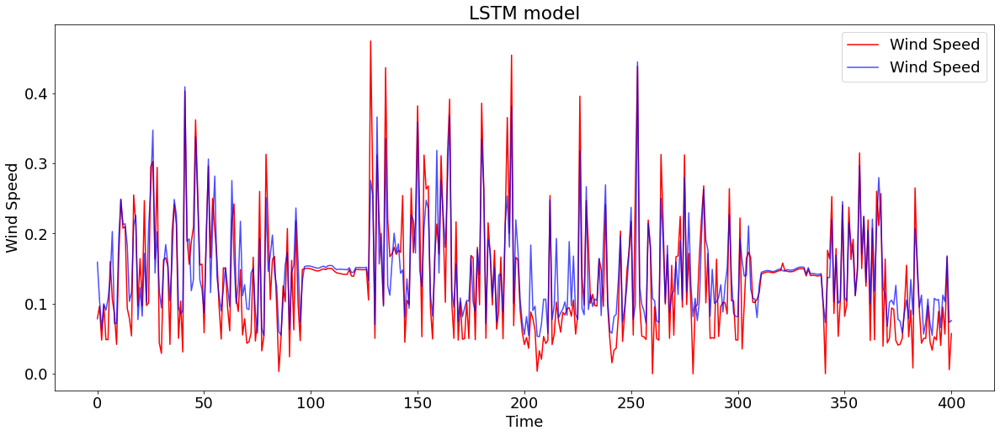

In [24]:
# build LSTM model
lstm_model=lstm(X_train,y_train)
lstm_predictions = get_result(lstm_model, X_test, y_test, "LSTM")
plot_predictions(y_test, lstm_predictions, yLabel, realLabel, predictedLabel, "LSTM model", xLabel="Time")

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 23, 40)            6720      
                                                                 
 dropout_1 (Dropout)         (None, 23, 40)            0         
                                                                 
 lstm_2 (LSTM)               (None, 23, 30)            8520      
                                                                 
 dropout_2 (Dropout)         (None, 23, 30)            0         
                                                                 
 lstm_3 (LSTM)               (None, 10)                1640      
                                                                 
 dropout_3 (Dropout)         (None, 10)                0         
                                                                 
 dense_1 (Dense)             (None, 1)                

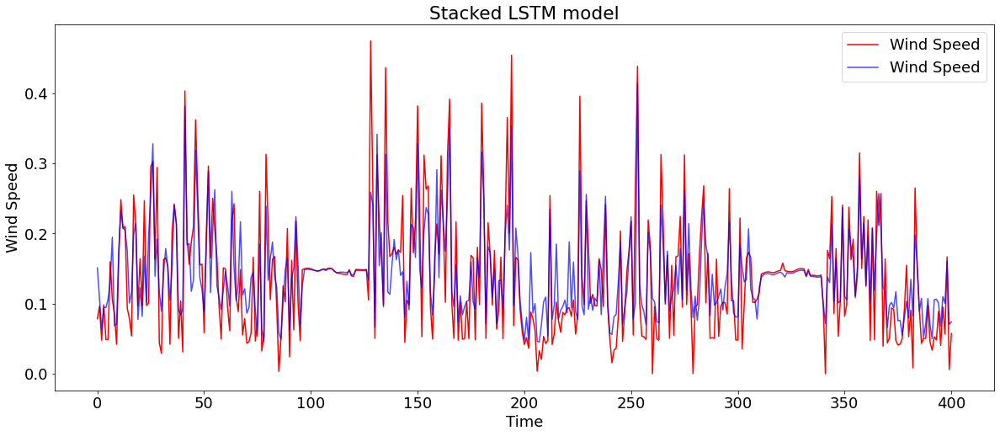

In [25]:
# build Stacked_LSTM model
s_lstm_model = stacked_lstm(X_train,y_train)

s_lstm_predictions = get_result(s_lstm_model, X_test, y_test, "Stacked LSTM")
plot_predictions(y_test, s_lstm_predictions, yLabel, realLabel, predictedLabel, "Stacked LSTM model", xLabel="Time")

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 40)                5160      
                                                                 
 dropout_4 (Dropout)         (None, 40)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 41        
                                                                 
Total params: 5,201
Trainable params: 5,201
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
102/102 [==============================] - 2s 7ms/step - loss: 0.0097
Epoch 2/30
102/102 [==============================] - 1s 8ms/step - loss: 0.0044
Epoch 3/30
102/102 [==============================] - 1s 9ms/step - loss: 0.0041
Epoch 4/30
102/102 [==============================] - 1s 8ms/step - loss:

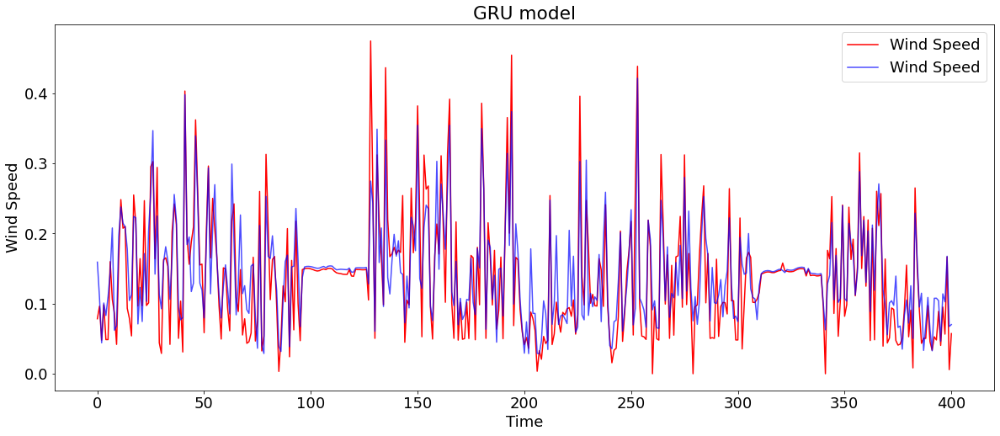

In [26]:
gru_model=gru(X_train,y_train)
gru_predictions = get_result(gru_model, X_test, y_test, "GRU")
plot_predictions(y_test, gru_predictions, yLabel, realLabel, predictedLabel, "GRU model", xLabel="Time" )

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn (SimpleRNN)      (None, 40)                1680      
                                                                 
 dropout_5 (Dropout)         (None, 40)                0         
                                                                 
 dense_3 (Dense)             (None, 1)                 41        
                                                                 
Total params: 1,721
Trainable params: 1,721
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
102/102 [==============================] - 1s 4ms/step - loss: 0.0085
Epoch 2/30
102/102 [==============================] - 0s 4ms/step - loss: 0.0050
Epoch 3/30
102/102 [==============================] - 0s 4ms/step - loss: 0.0043
Epoch 4/30
102/102 [==============================] - 0s 4ms/step - loss:

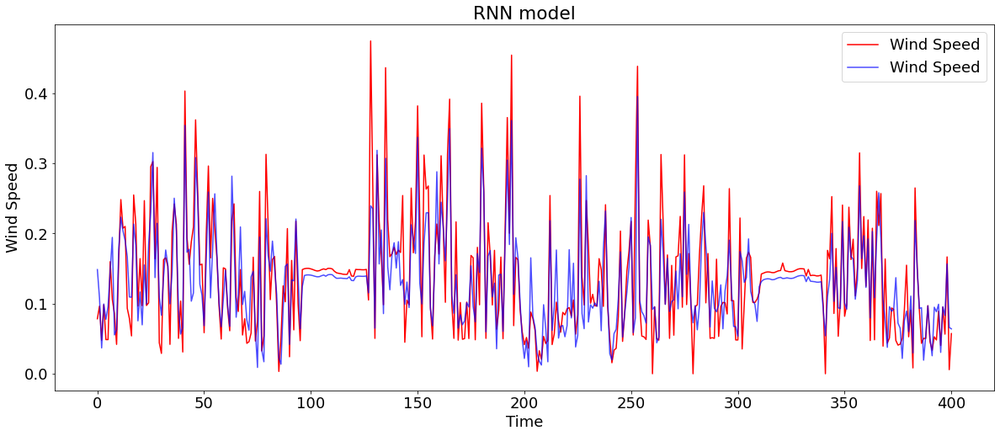

In [27]:
# build RNN model
rnn_model=rnn(X_train,y_train)
rnn_predictions = get_result(rnn_model, X_test, y_test, "RNN")
plot_predictions(y_test, rnn_predictions, yLabel, realLabel, predictedLabel, "RNN model", xLabel="Time"   )


Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 22, 64)            192       
                                                                 
 max_pooling1d (MaxPooling1D  (None, 11, 64)           0         
 )                                                               
                                                                 
 flatten (Flatten)           (None, 704)               0         
                                                                 
 dense_4 (Dense)             (None, 10)                7050      
                                                                 
 dense_5 (Dense)             (None, 1)                 11        
                                                                 
Total params: 7,253
Trainable params: 7,253
Non-trainable params: 0
____________________________________________________

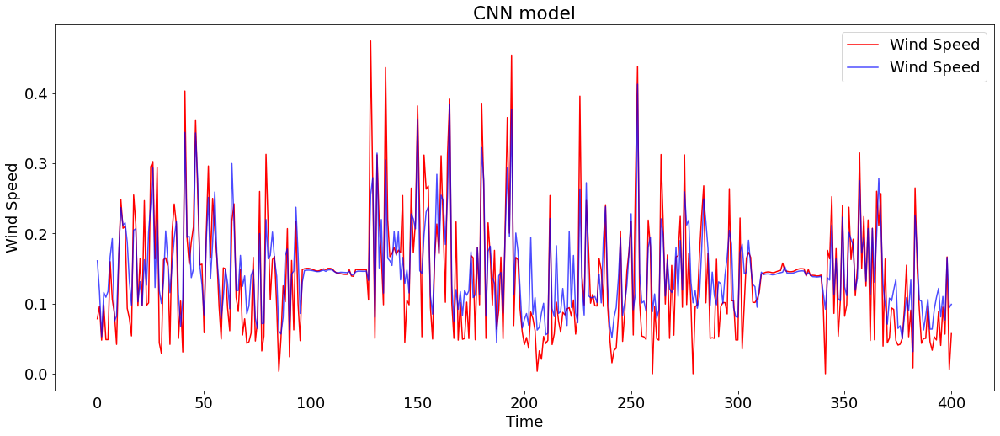

In [28]:
# build CNN model
cnn_model=cnn(X_train,y_train)
cnn_predictions = get_result(cnn_model, X_test, y_test, "CNN")
plot_predictions(y_test, cnn_predictions, yLabel, realLabel, predictedLabel, "CNN model", xLabel="Time" )

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDistr  (None, None, 23, 64)     128       
 ibuted)                                                         
                                                                 
 time_distributed_1 (TimeDis  (None, None, 11, 64)     0         
 tributed)                                                       
                                                                 
 time_distributed_2 (TimeDis  (None, None, 704)        0         
 tributed)                                                       
                                                                 
 lstm_4 (LSTM)               (None, 20)                58000     
                                                                 
 dense_6 (Dense)             (None, 1)                 21        
                                                      

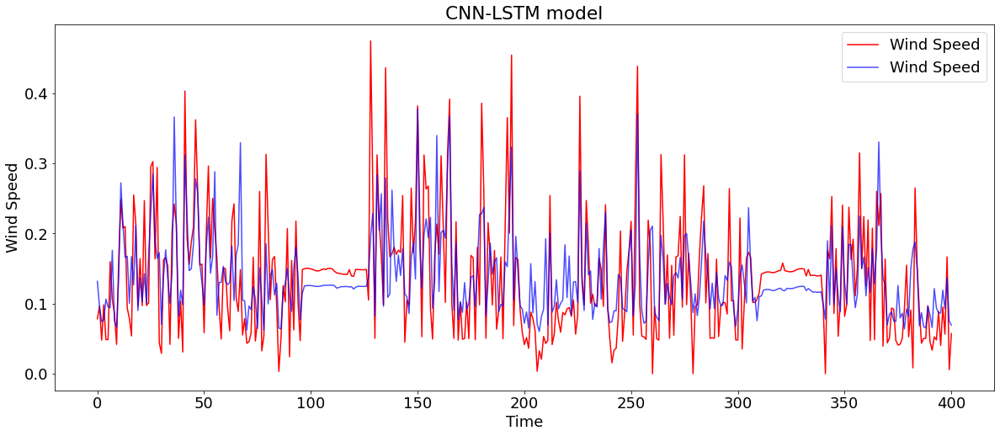

In [29]:
# build CNN-LSTM model
n_seq=1
cnn_lstm_model=cnn_lstm(X_train,y_train)
cnn_lstm_predictions = get_result(cnn_lstm_model, X_test.reshape((X_test.shape[0], n_seq, X_test.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnn_lstm_predictions, yLabel, realLabel, predictedLabel, "CNN-LSTM model", xLabel="Time",  )


Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d (ConvLSTM2D)    (None, 1, 22, 64)         33536     
                                                                 
 flatten_2 (Flatten)         (None, 1408)              0         
                                                                 
 dense_7 (Dense)             (None, 1)                 1409      
                                                                 
Total params: 34,945
Trainable params: 34,945
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
102/102 [==============================] - 2s 6ms/step - loss: 0.0091
Epoch 2/30
102/102 [==============================] - 1s 6ms/step - loss: 0.0055
Epoch 3/30
102/102 [==============================] - 1s 6ms/step - loss: 0.0043
Epoch 4/30
102/102 [==============================] - 1s 6ms/step - los

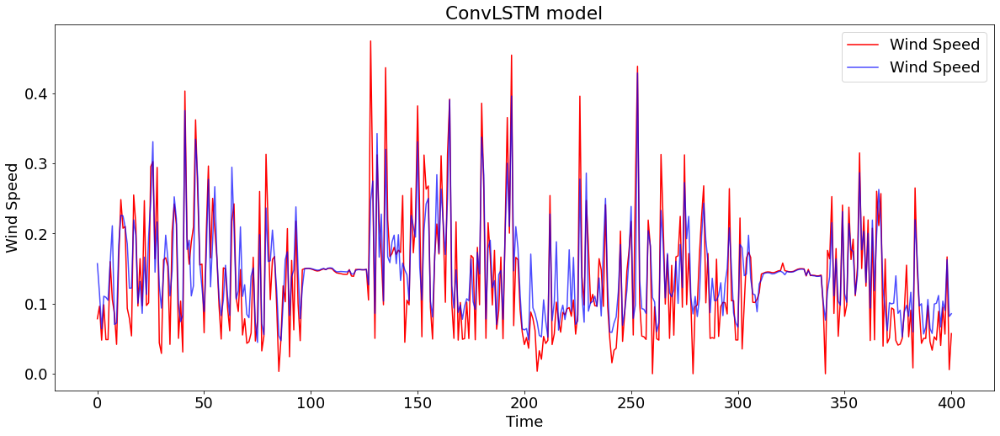

In [30]:
# build ConvLSTM model
n_seq=1
n_features = 1
conv_lstm_model=convlstm(X_train,y_train)

conv_lstm_predictions = get_result(conv_lstm_model, X_test.reshape((X_test.shape[0], n_seq, 1, X_test.shape[1], n_features)), y_test, "ConvLSTM")
plot_predictions(y_test, conv_lstm_predictions, yLabel, realLabel, predictedLabel, "ConvLSTM model", xLabel="Time"   )


# Adversarial Attacks

## Attack Functions

In [31]:
def signed_gradient(X_test, y): 
    X_tf = tf.convert_to_tensor(X_test, dtype=tf.float32)
    with tf.GradientTape() as tape:
        tape.watch(X_tf)
        lossFunction = mean_squared_error(X_tf, y.reshape(-1))
    gradientFunction = tape.gradient(lossFunction, X_tf)
    signed_grad = tf.sign(gradientFunction)
    return signed_grad.numpy()

def fgsm(X_test, y, epsilon=0.1):
    signed_grad = signed_gradient(X_test, y)
    X_perturbed = X_test + epsilon * signed_grad
    return X_perturbed

def bim(iterations, epsilon, alpha, X_test, y, final_X_only = True):
    X_perturbed = X_test.copy()
    for i in range(iterations):
        n = alpha * signed_gradient(X_perturbed, y)
        X_perturbed += n
        maxValues = np.maximum((X_test-epsilon), np.array(X_perturbed)) 
        X_perturbed = np.minimum((X_test+epsilon), maxValues)
       
        return X_perturbed
def pgd(iterations, epsilon, alpha, X_test, y, final_X_only = True):
    X_perturbed = X_test + np.random.uniform(-epsilon,epsilon,X_test.shape)
    for i in range(iterations):
        n = alpha * signed_gradient(X_perturbed, y)
        X_perturbed += n
        maxValues = np.maximum((X_test-epsilon), np.array(X_perturbed)) 
        X_perturbed = np.minimum((X_test+epsilon), maxValues)
        
        
        return X_perturbed

## Attacks on Models

In [32]:
epsilon = 0.2
alpha = 0.2

### Attacks on LSTM

Model - FGSM perturbed LSTM:
R^2 Score: -1.3703421663181943
RMSE: 0.129393113326455


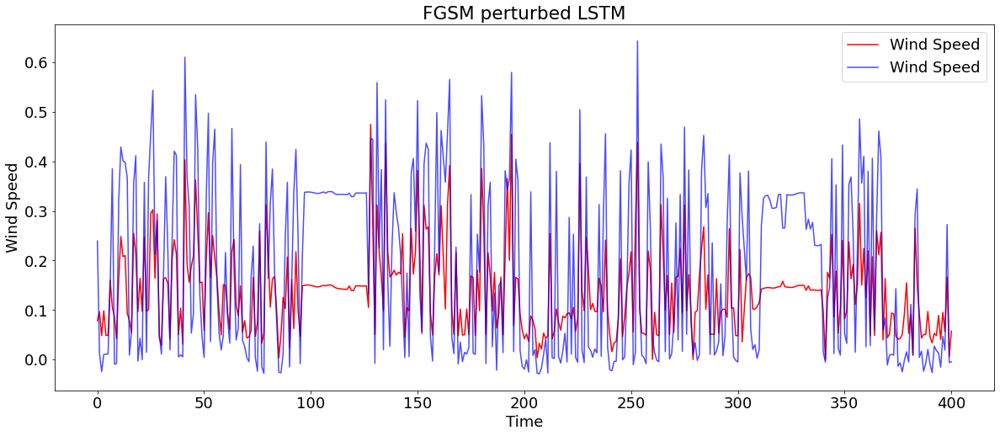

In [33]:
X_fgsm_perturbed_lstm = fgsm(X_test, y_test, epsilon) 
fgsm_predictions_lstm = get_result(lstm_model, X_fgsm_perturbed_lstm, y_test, "FGSM perturbed LSTM")
plot_predictions(y_test, fgsm_predictions_lstm, yLabel, realLabel, predictedLabel, "FGSM perturbed LSTM", xLabel="Time")

In [34]:
# run this to show intermediate results
# bim(lstm_model, 5, 0.1, 0.05, X_test, y_test, final_X_only = False)

Model - BIM perturbed LSTM:
R^2 Score: -1.3703420978091372
RMSE: 0.12939310612883392


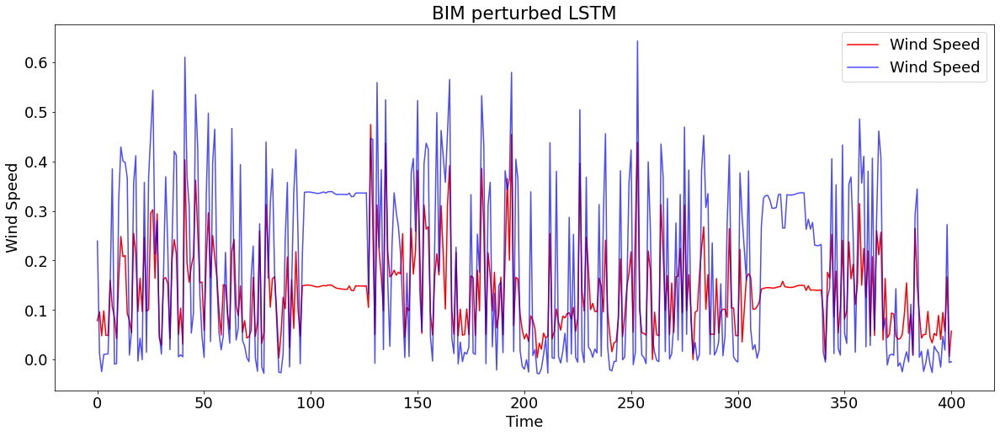

In [35]:
X_bim_perturbed_lstm = bim(5, epsilon, alpha, X_test, y_test)
bim_predictions_lstm = get_result(lstm_model, X_bim_perturbed_lstm, y_test, "BIM perturbed LSTM")
plot_predictions(y_test, bim_predictions_lstm, yLabel, realLabel, predictedLabel, "BIM perturbed LSTM", xLabel="Time")

In [36]:
# run this to show intermediate results
# pgd(lstm_model, 5, 0.1, 0.05, X_test, y_test, final_X_only =False)

Model - PGD perturbed LSTM:
R^2 Score: -0.17533465806362591
RMSE: 0.09111427600967657


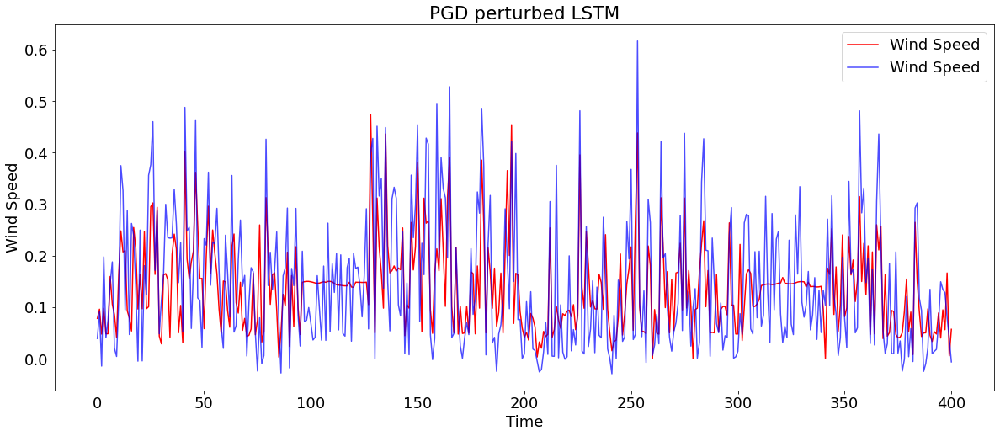

In [37]:
X_pgd_perturbed_lstm = pgd(5, epsilon, alpha, X_test, y_test)
pgd_predictions_lstm = get_result(lstm_model, X_pgd_perturbed_lstm, y_test, "PGD perturbed LSTM")
plot_predictions(y_test, pgd_predictions_lstm, yLabel, realLabel, predictedLabel, "PGD perturbed LSTM", xLabel="Time")

### Attacks on Stacked LSTM

Model - FGSM perturbed Stacked LSTM:
R^2 Score: -1.0732236974615192
RMSE: 0.12101207947754984


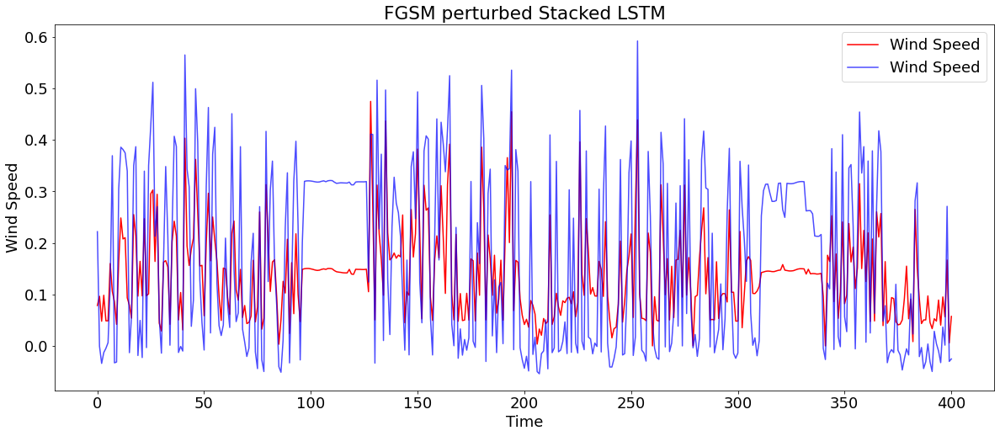

In [38]:
X_fgsm_perturbed_stlstm = fgsm(X_test, y_test, epsilon) 
fgsm_predictions_stlstm = get_result(s_lstm_model, X_fgsm_perturbed_stlstm, y_test, "FGSM perturbed Stacked LSTM")
plot_predictions(y_test, fgsm_predictions_stlstm, yLabel, realLabel, predictedLabel,  "FGSM perturbed Stacked LSTM", xLabel="Time")

Model - BIM perturbed Stacked LSTM:
R^2 Score: -1.0732236428864428
RMSE: 0.12101207947754984


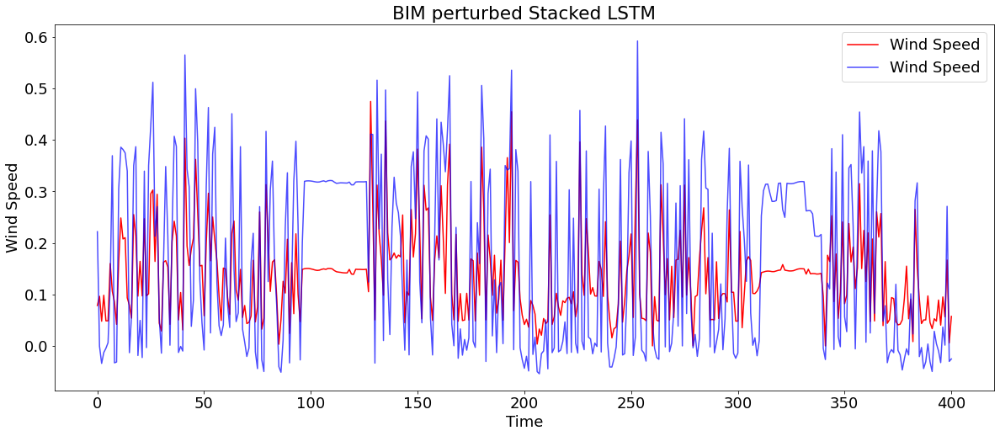

In [39]:

X_bim_perturbed_stlstm = bim(5, epsilon, alpha, X_test, y_test)
bim_predictions_stlstm = get_result(s_lstm_model, X_bim_perturbed_stlstm, y_test, "BIM perturbed Stacked LSTM")
plot_predictions(y_test, bim_predictions_stlstm, yLabel, realLabel, predictedLabel, "BIM perturbed Stacked LSTM", xLabel="Time",)


Model - PGD perturbed Stacked LSTM:
R^2 Score: -0.19483602920019294
RMSE: 0.09186705990463001


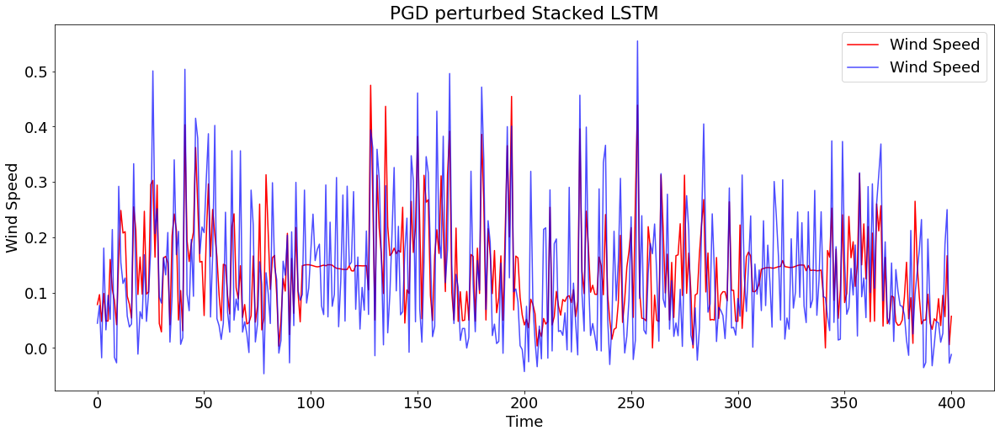

In [40]:
X_pgd_perturbed_stlstm = pgd(5, epsilon, alpha, X_test, y_test)
pgd_predictions_stlstm = get_result(s_lstm_model, X_pgd_perturbed_stlstm, y_test, "PGD perturbed Stacked LSTM")
plot_predictions(y_test, pgd_predictions_stlstm, yLabel, realLabel, predictedLabel, "PGD perturbed Stacked LSTM", xLabel="Time" )

### Attacks on GRU

Model - FGSM perturbed GRU:
R^2 Score: -2.349120846494715
RMSE: 0.15380521498102484


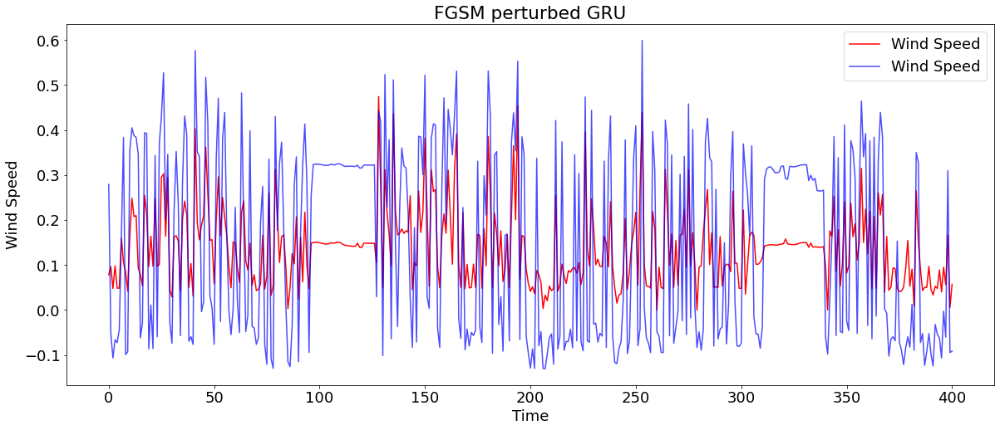

In [41]:
# need to copy the same things above
# replace the variable names carefully
X_fgsm_perturbed_gru = fgsm(X_test, y_test, epsilon) 
fgsm_predictions_gru = get_result(gru_model, X_fgsm_perturbed_gru, y_test, "FGSM perturbed GRU")
plot_predictions(y_test, fgsm_predictions_gru, yLabel, realLabel, predictedLabel, "FGSM perturbed GRU", xLabel="Time" )

Model - BIM perturbed GRU:
R^2 Score: -2.3491207560704765
RMSE: 0.15380521498102484


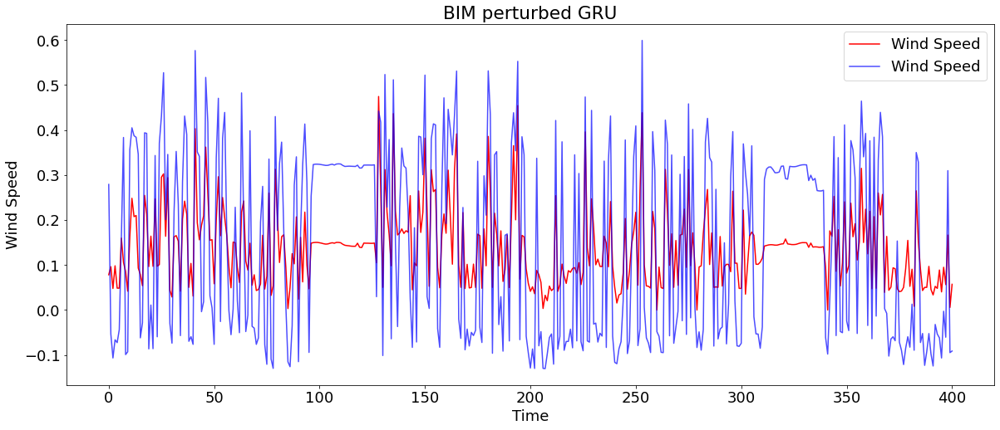

In [42]:

X_bim_perturbed_gru = bim(5, epsilon, alpha, X_test, y_test)
bim_predictions_gru = get_result(gru_model, X_bim_perturbed_gru, y_test, "BIM perturbed GRU")
plot_predictions(y_test, bim_predictions_gru, yLabel, realLabel, predictedLabel, "BIM perturbed GRU", xLabel="Time" )


Model - PGD perturbed GRU:
R^2 Score: -1.241008804777652
RMSE: 0.1258135487569123


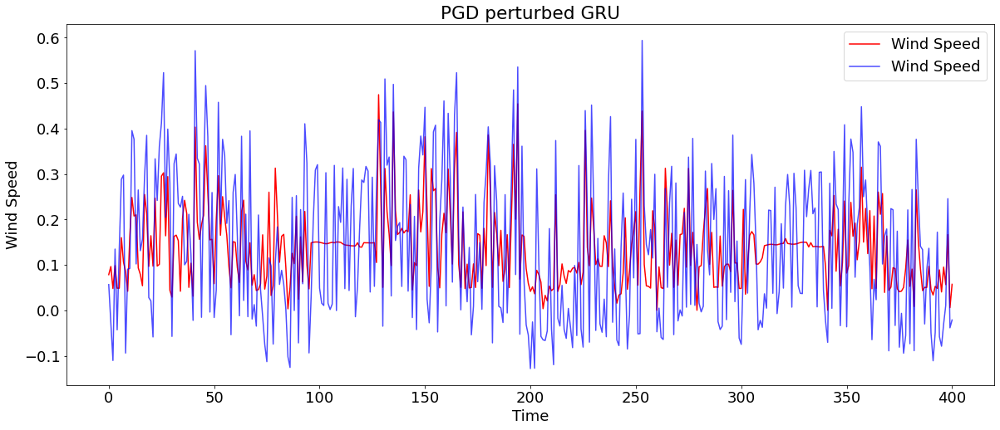

In [43]:
X_pgd_perturbed_gru = pgd(5, epsilon, alpha, X_test, y_test)
pgd_predictions_gru = get_result(gru_model, X_pgd_perturbed_gru, y_test, "PGD perturbed GRU")
plot_predictions(y_test, pgd_predictions_gru, yLabel, realLabel, predictedLabel, "PGD perturbed GRU", xLabel="Time" )

### Attacks on RNN

In [44]:
# need to copy the same things above
# replace the variable names carefully

Model - FGSM perturbed RNN:
R^2 Score: -2.1079836992067857
RMSE: 0.14816478724042192


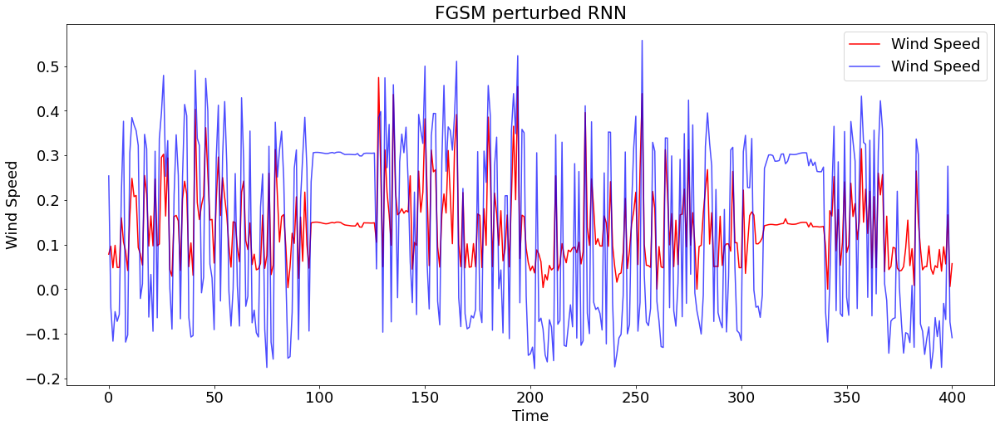

In [45]:
X_fgsm_perturbed_rnn = fgsm(X_test, y_test, epsilon ) 
fgsm_predictions_rnn = get_result(rnn_model, X_fgsm_perturbed_rnn, y_test, "FGSM perturbed RNN")
plot_predictions(y_test, fgsm_predictions_rnn, yLabel, realLabel, predictedLabel, "FGSM perturbed RNN", xLabel="Time" )

Model - BIM perturbed RNN:
R^2 Score: -2.107983647304312
RMSE: 0.14816478724042192


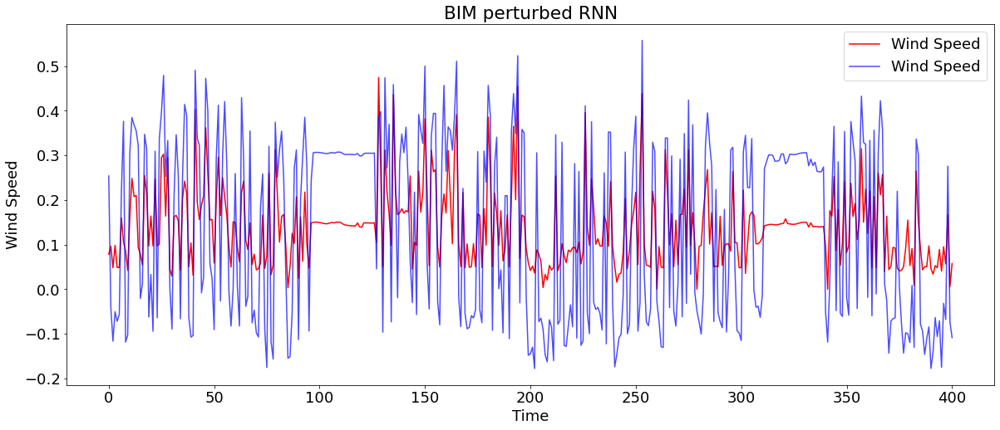

In [46]:
X_bim_perturbed_rnn = bim(5, epsilon, alpha, X_test, y_test)
bim_predictions_rnn = get_result(rnn_model, X_bim_perturbed_rnn, y_test, "BIM perturbed RNN")
plot_predictions(y_test, bim_predictions_rnn, yLabel, realLabel, predictedLabel, "BIM perturbed RNN", xLabel="Time" )


Model - PGD perturbed RNN:
R^2 Score: -1.4087734302203465
RMSE: 0.1304378481491517


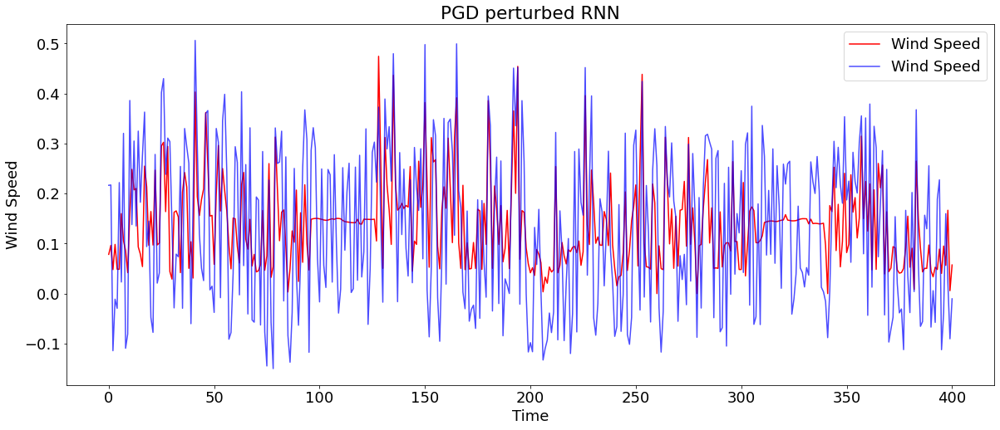

In [47]:
X_pgd_perturbed_rnn = pgd(5, epsilon, alpha, X_test, y_test)
pgd_predictions_rnn = get_result(rnn_model, X_pgd_perturbed_rnn, y_test, "PGD perturbed RNN")
plot_predictions(y_test, pgd_predictions_rnn, yLabel, realLabel, predictedLabel, "PGD perturbed RNN", xLabel="Time" )

### Attacks on CNN

In [48]:
# need to copy the same things above
# replace the variable names carefully

Model - FGSM perturbed CNN:
R^2 Score: -1.2138679687710594
RMSE: 0.12504936524990423


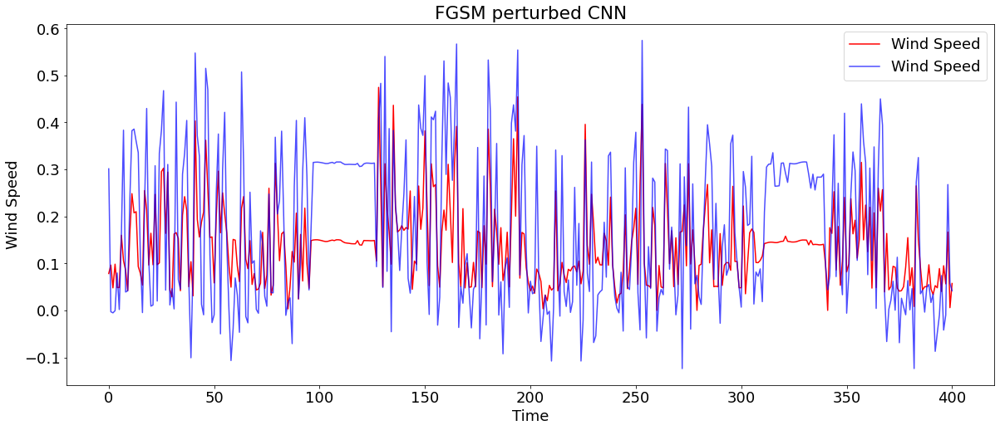

In [49]:
X_fgsm_perturbed_cnn = fgsm(X_test, y_test, epsilon ) 
fgsm_predictions_cnn = get_result(cnn_model, X_fgsm_perturbed_cnn, y_test, "FGSM perturbed CNN")
plot_predictions(y_test, fgsm_predictions_cnn, yLabel, realLabel, predictedLabel, "FGSM perturbed CNN", xLabel="Time" )

Model - BIM perturbed CNN:
R^2 Score: -1.2138678911032899
RMSE: 0.12504936524990423


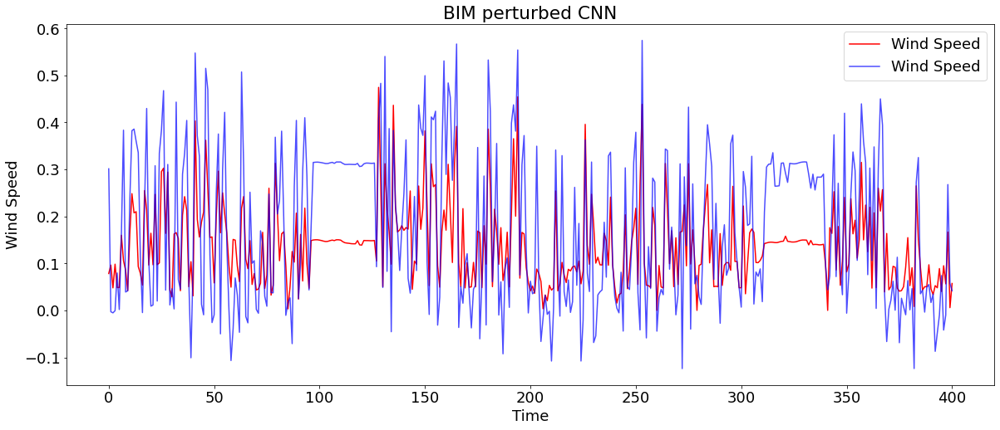

In [50]:
X_bim_perturbed_cnn = bim(5, epsilon, alpha, X_test, y_test)
bim_predictions_cnn = get_result(cnn_model, X_bim_perturbed_cnn, y_test, "BIM perturbed CNN")
plot_predictions(y_test, bim_predictions_cnn, yLabel, realLabel, predictedLabel, "BIM perturbed CNN", xLabel="Time" )


Model - PGD perturbed CNN:
R^2 Score: -0.7367814445459053
RMSE: 0.11075879801620966


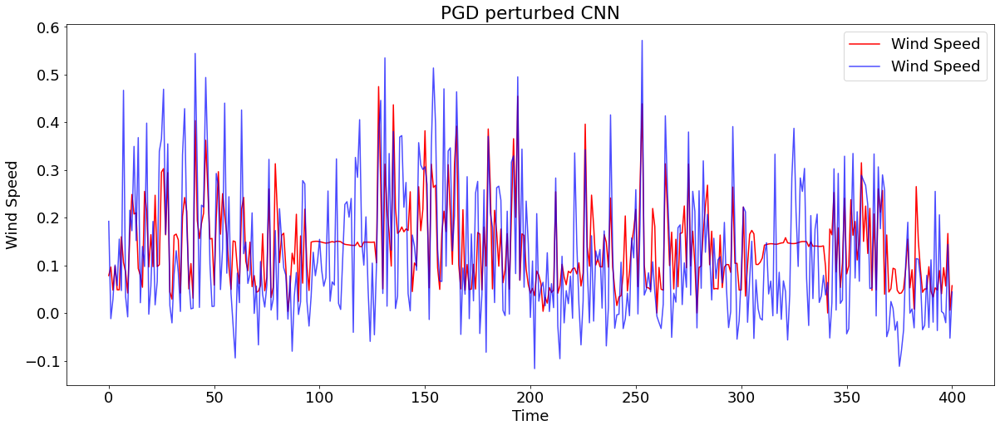

In [51]:
X_pgd_perturbed_cnn = pgd(5, epsilon, alpha,X_test, y_test)
pgd_predictions_cnn = get_result(cnn_model, X_pgd_perturbed_cnn, y_test, "PGD perturbed CNN")
plot_predictions(y_test, pgd_predictions_cnn, yLabel, realLabel, predictedLabel, "PGD perturbed CNN", xLabel="Time")

### Attacks on CNN-LSTM

Model - CNN-LSTM:
R^2 Score: -1.3042181302220022
RMSE: 0.12757554430667017


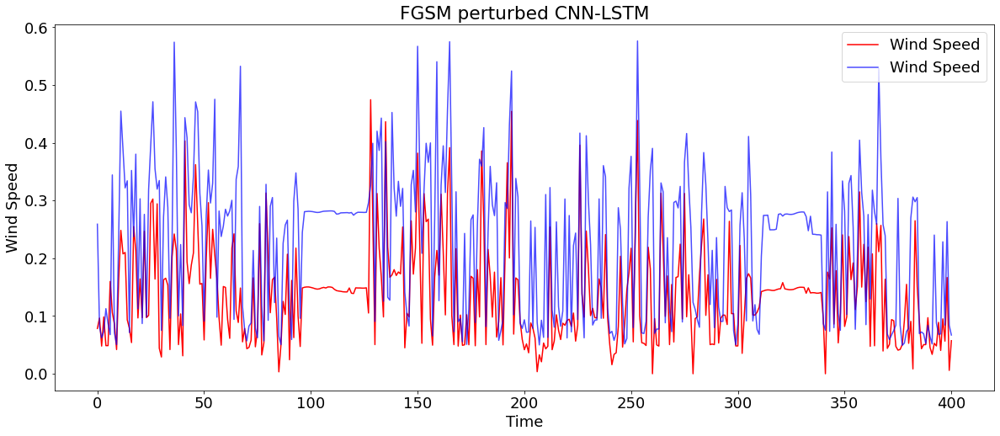

In [52]:
X_fgsm_perturbed_cnnlstm = fgsm(X_test, y_test, epsilon ) 
fgsm_predictions_cnnlstm = get_result(cnn_lstm_model, X_fgsm_perturbed_cnnlstm.reshape((X_fgsm_perturbed_cnnlstm.shape[0], n_seq, X_fgsm_perturbed_cnnlstm.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, fgsm_predictions_cnnlstm, yLabel, realLabel, predictedLabel, "FGSM perturbed CNN-LSTM", xLabel="Time")

Model - BIM CNN-LSTM:
R^2 Score: -1.3042180728959276
RMSE: 0.12757554430667017


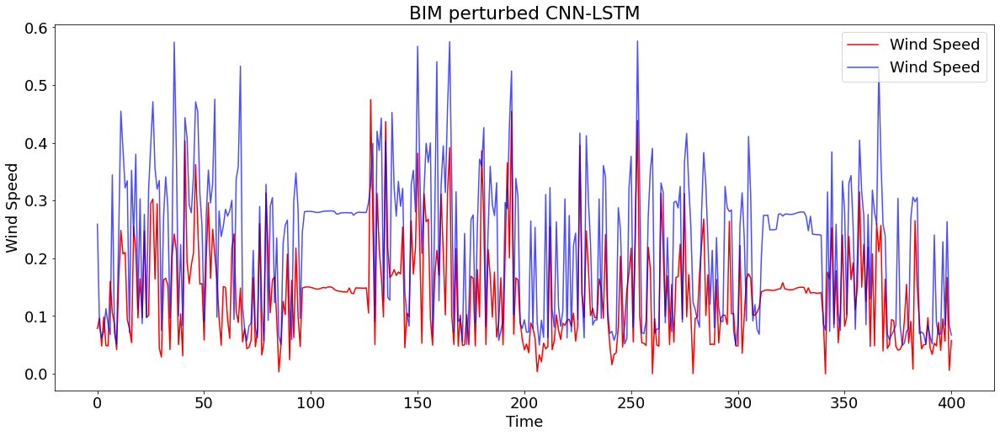

In [53]:
X_bim_perturbed_cnnlstm = bim(5, epsilon, alpha,X_test, y_test) 
bim_predictions_cnnlstm = get_result(cnn_lstm_model, X_bim_perturbed_cnnlstm.reshape((X_bim_perturbed_cnnlstm.shape[0], n_seq, X_bim_perturbed_cnnlstm.shape[1], 1)), y_test, "BIM CNN-LSTM")
plot_predictions(y_test, bim_predictions_cnnlstm, yLabel, realLabel, predictedLabel, "BIM perturbed CNN-LSTM", xLabel="Time")

Model - PGD CNN-LSTM:
R^2 Score: -1.2413895420947823
RMSE: 0.12582423737262802


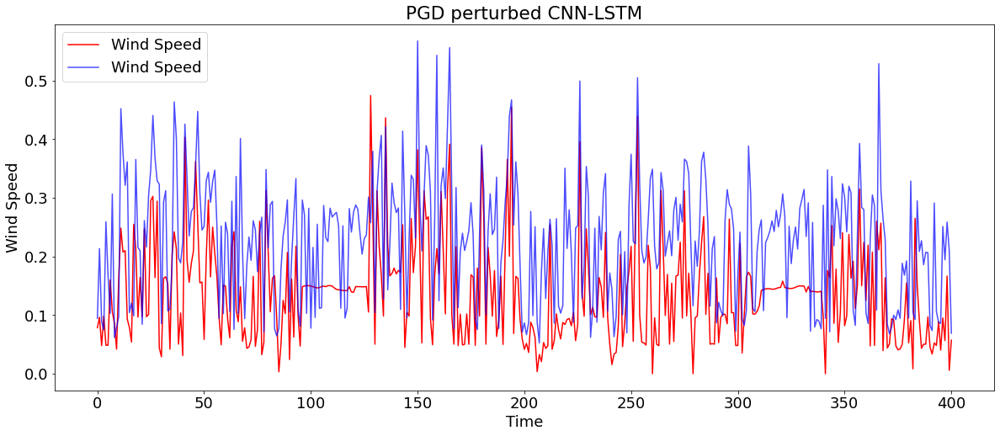

In [54]:
X_pgd_perturbed_cnnlstm = pgd(5,  epsilon, alpha, X_test, y_test) 
pgd_predictions_cnnlstm = get_result(cnn_lstm_model, X_pgd_perturbed_cnnlstm.reshape((X_pgd_perturbed_cnnlstm.shape[0], n_seq, X_pgd_perturbed_cnnlstm.shape[1], 1)), y_test, "PGD CNN-LSTM")
plot_predictions(y_test, pgd_predictions_cnnlstm, yLabel, realLabel, predictedLabel, "PGD perturbed CNN-LSTM", xLabel="Time" )

### Attacks on ConvLSTM

Model - Conv-LSTM:
R^2 Score: -1.3934027220391805
RMSE: 0.13002100741542796


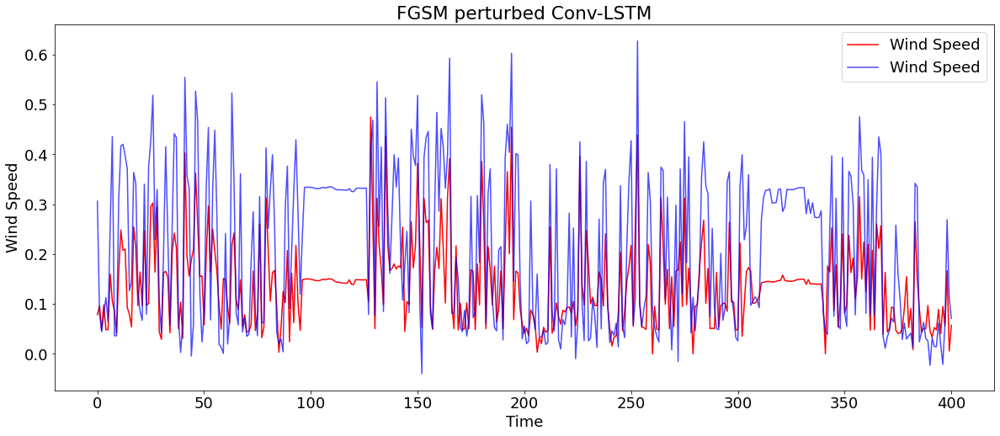

In [55]:
X_fgsm_perturbed_convlstm = fgsm(X_test, y_test, epsilon ) 
fgsm_predictions_convlstm = get_result(conv_lstm_model, X_fgsm_perturbed_convlstm.reshape((X_fgsm_perturbed_convlstm.shape[0], n_seq,1, X_fgsm_perturbed_convlstm.shape[1], 1)), y_test, "Conv-LSTM")
plot_predictions(y_test, fgsm_predictions_convlstm, yLabel, realLabel, predictedLabel,  "FGSM perturbed Conv-LSTM", xLabel="Time" )

Model - BIM ConvLSTM:
R^2 Score: -1.3934026623415425
RMSE: 0.1300210145782901


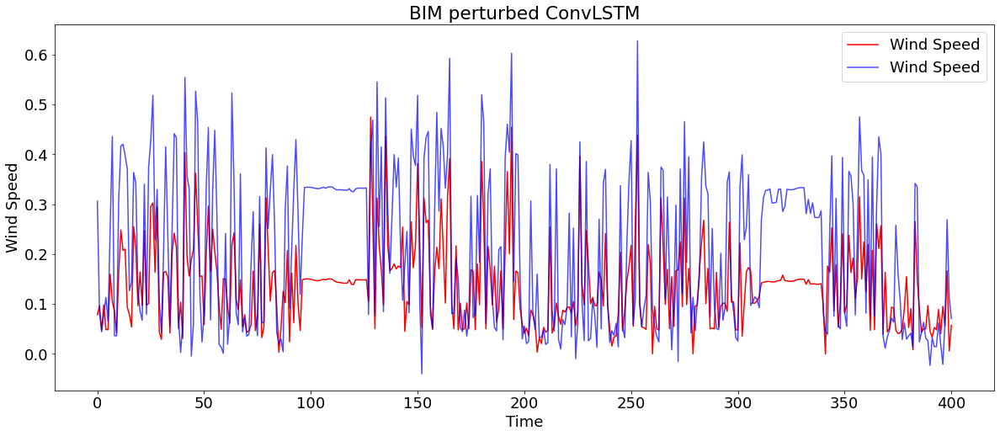

In [56]:
X_bim_perturbed_convlstm = bim(5, epsilon, alpha, X_test, y_test) 
bim_predictions_convlstm = get_result(conv_lstm_model, X_bim_perturbed_convlstm.reshape((X_bim_perturbed_convlstm.shape[0], n_seq,1, X_bim_perturbed_convlstm.shape[1], 1)), y_test, "BIM ConvLSTM")
plot_predictions(y_test, bim_predictions_convlstm, yLabel, realLabel, predictedLabel, "BIM perturbed ConvLSTM", xLabel="Time")

Model - PGD ConvLSTM:
R^2 Score: -1.0769400769060726
RMSE: 0.12112049222806581


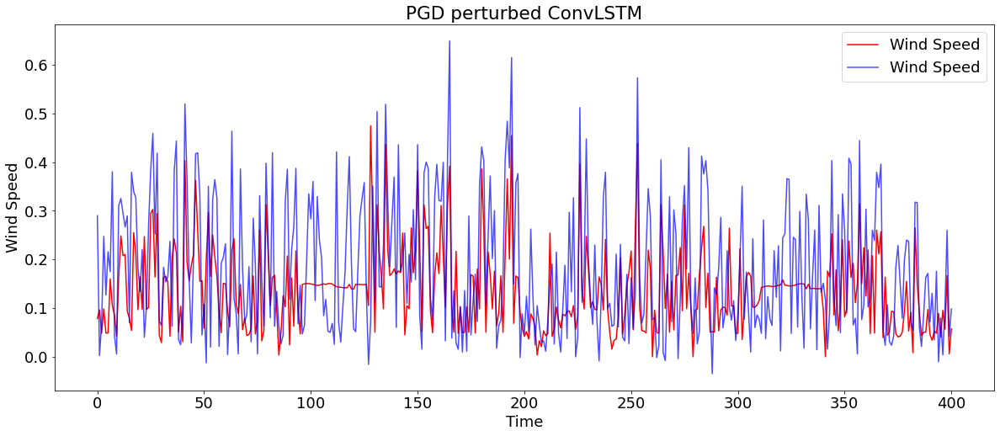

In [57]:
X_pgd_perturbed_convlstm = pgd(5,  epsilon, alpha, X_test, y_test) 
pgd_predictions_convlstm = get_result(conv_lstm_model, X_pgd_perturbed_convlstm.reshape((X_pgd_perturbed_convlstm.shape[0], n_seq,1, X_pgd_perturbed_convlstm.shape[1], 1)), y_test, "PGD ConvLSTM")
plot_predictions(y_test, pgd_predictions_convlstm, yLabel, realLabel, predictedLabel, "PGD perturbed ConvLSTM", xLabel="Time")

## Adversarial Learning

In [58]:
new_Y=np.concatenate((y_train,y_train))

In [59]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon=0.1)
X_new_fgsm=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_lstm=lstm(X_new_fgsm,new_Y)

2022-04-23 18:57:29.093034: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 1949484600 exceeds 10% of free system memory.
2022-04-23 18:57:29.661144: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 1949484600 exceeds 10% of free system memory.
2022-04-23 18:57:29.992100: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 1949484600 exceeds 10% of free system memory.
2022-04-23 18:57:30.489289: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 1949484600 exceeds 10% of free system memory.
2022-04-23 18:57:30.859765: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 1949484600 exceeds 10% of free system memory.


Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_5 (LSTM)               (None, 40)                6720      
                                                                 
 dropout_6 (Dropout)         (None, 40)                0         
                                                                 
 dense_8 (Dense)             (None, 1)                 41        
                                                                 
Total params: 6,761
Trainable params: 6,761
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
204/204 [==============================] - 2s 7ms/step - loss: 0.0069
Epoch 2/30
204/204 [==============================] - 1s 7ms/step - loss: 0.0050
Epoch 3/30
204/204 [==============================] - 1s 7ms/step - loss: 0.0047
Epoch 4/30
204/204 [==============================] - 1s 7ms/step - loss:

Model - FGSM-LSTM:
R^2 Score: 0.7140087147321477
RMSE: 0.044945068177027106


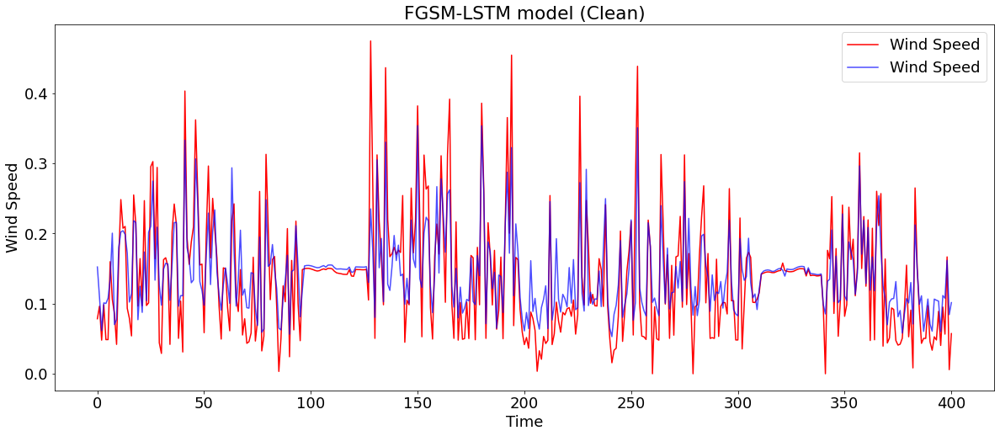

In [60]:
lstm_fgsm_predictions=get_result(fgsm_lstm, X_test, y_test, "FGSM-LSTM")
plot_predictions(y_test, lstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-LSTM model (Clean)", xLabel="Time" )

Model - FGSM-LSTM:
R^2 Score: 0.49063549640367066
RMSE: 0.05998186699850113


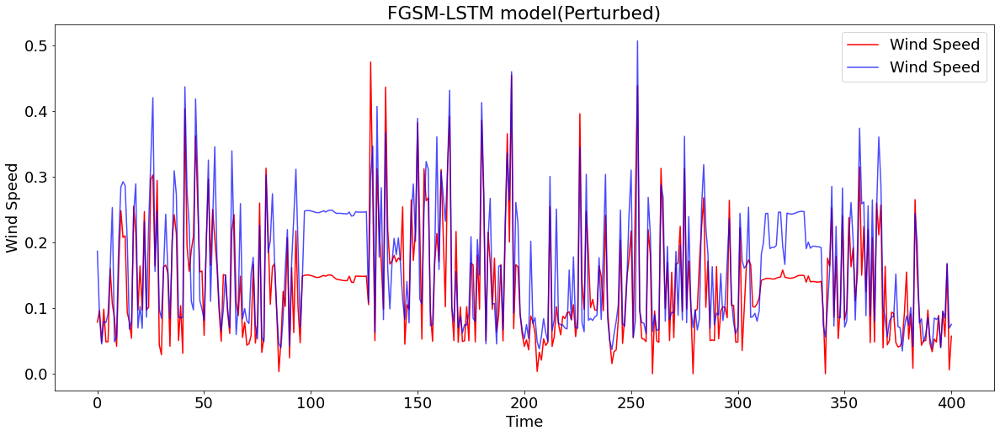

In [61]:
lstm_fgsm_predictions=get_result(fgsm_lstm, X_fgsm_perturbed_lstm, y_test, "FGSM-LSTM")
plot_predictions(y_test, lstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-LSTM model(Perturbed)", xLabel="Time" )

In [62]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,0.1,0.05,X_train, y_train)
X_new_bim=np.concatenate((X_train,X_bim_perturbed_train))
bim_lstm=lstm(X_new_bim,new_Y)


Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 40)                6720      
                                                                 
 dropout_7 (Dropout)         (None, 40)                0         
                                                                 
 dense_9 (Dense)             (None, 1)                 41        
                                                                 
Total params: 6,761
Trainable params: 6,761
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
204/204 [==============================] - 3s 7ms/step - loss: 0.0070
Epoch 2/30
204/204 [==============================] - 1s 7ms/step - loss: 0.0048
Epoch 3/30
204/204 [==============================] - 1s 7ms/step - loss: 0.0044
Epoch 4/30
204/204 [==============================] - 1s 7ms/step - loss:

Model - BIM-LSTM:
R^2 Score: 0.6966468420855281
RMSE: 0.04628922607296399


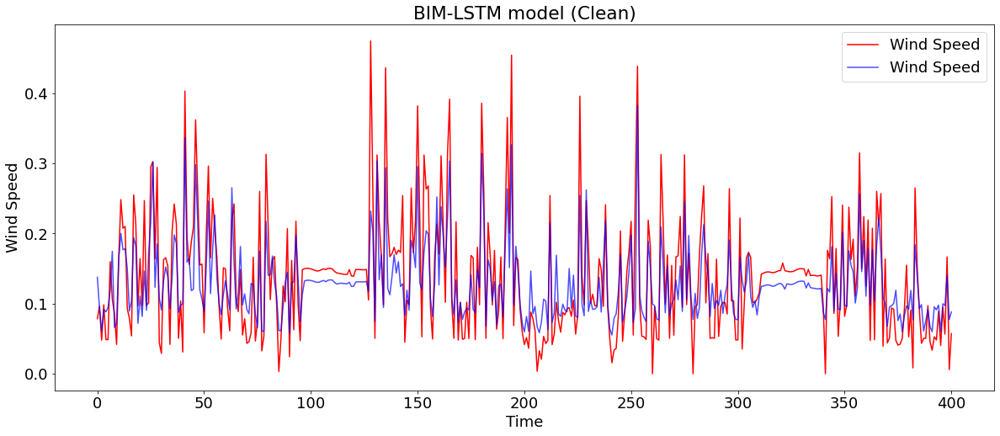

In [63]:

lstm_bim_predictions=get_result(bim_lstm, X_test, y_test, "BIM-LSTM")
plot_predictions(y_test, lstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-LSTM model (Clean)", xLabel="Time" )

Model - BIM-LSTM:
R^2 Score: -0.1279020364262935
RMSE: 0.08925680539754575


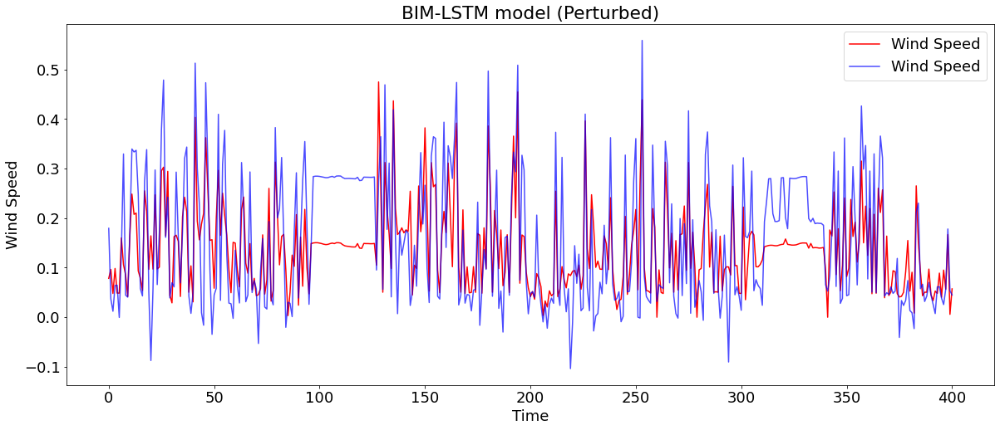

In [64]:

lstm_bim_predictions=get_result(bim_lstm, X_bim_perturbed_lstm, y_test, "BIM-LSTM")
plot_predictions(y_test, lstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-LSTM model (Perturbed)", xLabel="Time" )


In [65]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,0.1,0.05,X_train, y_train)
X_new_pgd=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_lstm=lstm(X_new_pgd,new_Y)

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_7 (LSTM)               (None, 40)                6720      
                                                                 
 dropout_8 (Dropout)         (None, 40)                0         
                                                                 
 dense_10 (Dense)            (None, 1)                 41        
                                                                 
Total params: 6,761
Trainable params: 6,761
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
204/204 [==============================] - 3s 8ms/step - loss: 0.0076
Epoch 2/30
204/204 [==============================] - 2s 9ms/step - loss: 0.0051
Epoch 3/30
204/204 [==============================] - 2s 8ms/step - loss: 0.0047
Epoch 4/30
204/204 [==============================] - 1s 7ms/step - loss:

Model - PGD-LSTM:
R^2 Score: 0.7148081692898287
RMSE: 0.04488220484598631


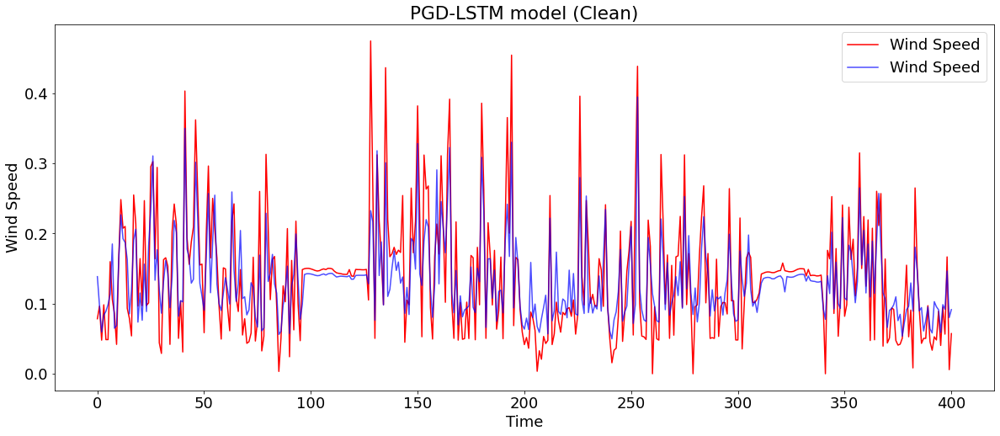

In [66]:
lstm_pgd_predictions=get_result(pgd_lstm, X_test, y_test, "PGD-LSTM")
plot_predictions(y_test, lstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-LSTM model (Clean)", xLabel="Time" )

Model - PGS-LSTM:
R^2 Score: 0.5244185324441735
RMSE: 0.05795862973883226


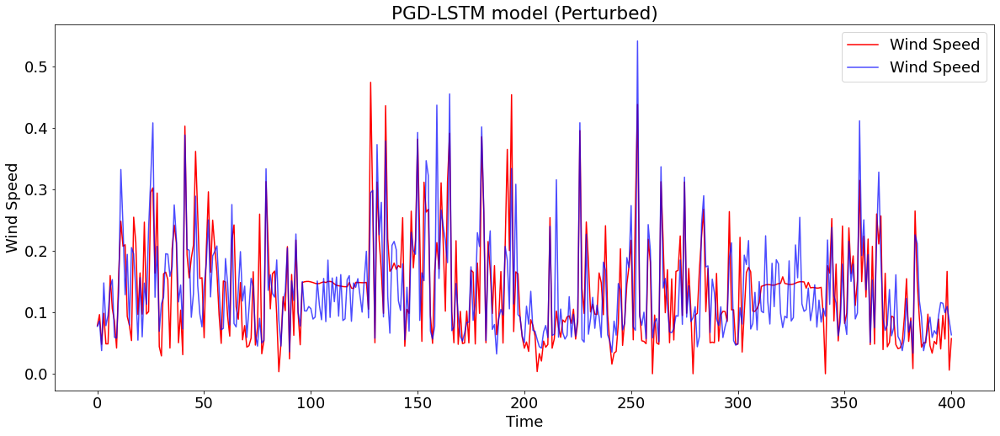

In [67]:
lstm_pgd_predictions=get_result(pgd_lstm, X_pgd_perturbed_lstm, y_test, "PGS-LSTM")
plot_predictions(y_test, lstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-LSTM model (Perturbed)", xLabel="Time" )

#### Stacked LSTM

In [68]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon=0.1)
X_new_fgsm=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_stlstm=stacked_lstm(X_new_fgsm,new_Y)

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (None, 23, 40)            6720      
                                                                 
 dropout_9 (Dropout)         (None, 23, 40)            0         
                                                                 
 lstm_9 (LSTM)               (None, 23, 30)            8520      
                                                                 
 dropout_10 (Dropout)        (None, 23, 30)            0         
                                                                 
 lstm_10 (LSTM)              (None, 10)                1640      
                                                                 
 dropout_11 (Dropout)        (None, 10)                0         
                                                                 
 dense_11 (Dense)            (None, 1)               

Model - FGSM-StackedLSTM:
R^2 Score: 0.7037611001870705
RMSE: 0.045743213091525715


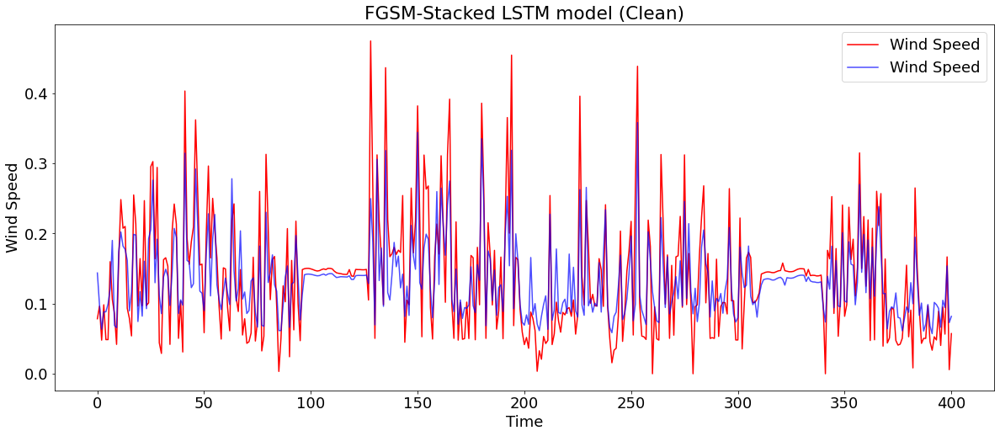

In [69]:
stlstm_fgsm_predictions=get_result(fgsm_stlstm, X_test, y_test, "FGSM-StackedLSTM")
plot_predictions(y_test, stlstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-Stacked LSTM model (Clean)", xLabel="Time" )

Model - FGSM-StackedLSTM:
R^2 Score: 0.30910477343385157
RMSE: 0.06985729274513314


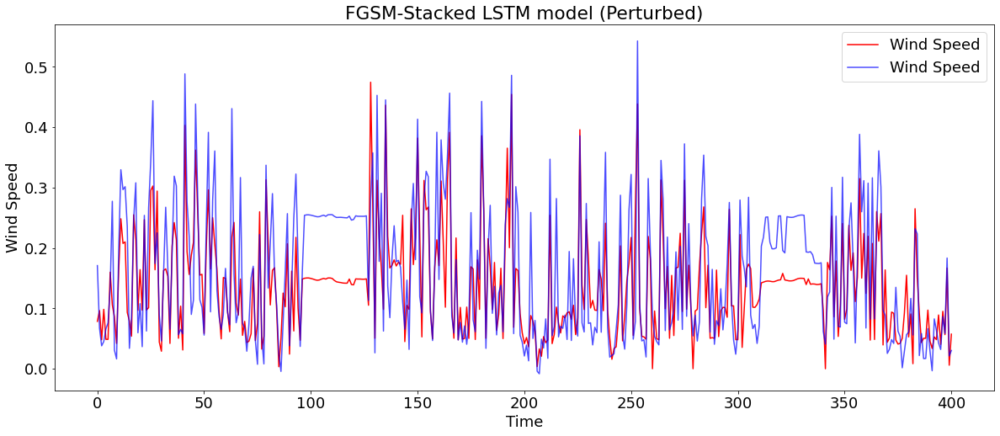

In [70]:
stlstm_fgsm_predictions=get_result(fgsm_stlstm, X_fgsm_perturbed_stlstm, y_test, "FGSM-StackedLSTM")
plot_predictions(y_test, stlstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-Stacked LSTM model (Perturbed)", xLabel="Time" )

In [71]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,0.1,0.05,X_train, y_train)
X_new_bim=np.concatenate((X_train,X_bim_perturbed_train))
bim_stlstm=stacked_lstm(X_new_bim,new_Y)

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_11 (LSTM)              (None, 23, 40)            6720      
                                                                 
 dropout_12 (Dropout)        (None, 23, 40)            0         
                                                                 
 lstm_12 (LSTM)              (None, 23, 30)            8520      
                                                                 
 dropout_13 (Dropout)        (None, 23, 30)            0         
                                                                 
 lstm_13 (LSTM)              (None, 10)                1640      
                                                                 
 dropout_14 (Dropout)        (None, 10)                0         
                                                                 
 dense_12 (Dense)            (None, 1)               

Model - BIM-StackedLSTM:
R^2 Score: 0.7125986234589976
RMSE: 0.04505573159855687


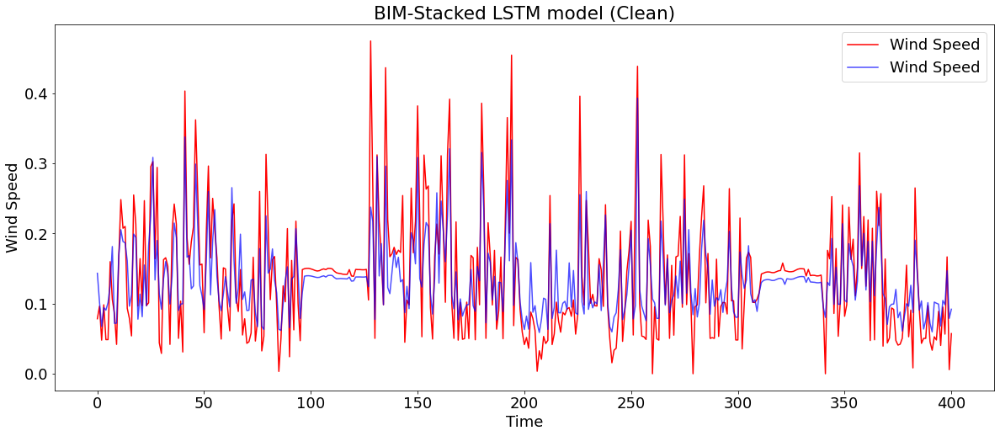

In [72]:

stlstm_bim_predictions=get_result(bim_stlstm, X_test, y_test, "BIM-StackedLSTM")
plot_predictions(y_test, stlstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-Stacked LSTM model (Clean)", xLabel="Time" )


Model - BIM-StackedLSTM:
R^2 Score: -0.14521689354056266
RMSE: 0.08993930503552858


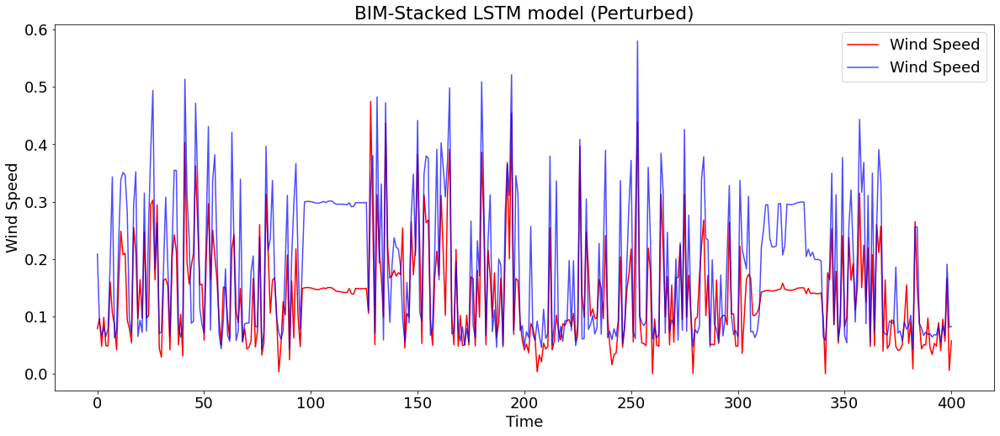

In [73]:

stlstm_bim_predictions=get_result(bim_stlstm, X_bim_perturbed_stlstm, y_test, "BIM-StackedLSTM")
plot_predictions(y_test, stlstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-Stacked LSTM model (Perturbed)", xLabel="Time" )


In [74]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,0.1,0.05,X_train, y_train)
X_new_pgd=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_stlstm=stacked_lstm(X_new_pgd,new_Y)

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_14 (LSTM)              (None, 23, 40)            6720      
                                                                 
 dropout_15 (Dropout)        (None, 23, 40)            0         
                                                                 
 lstm_15 (LSTM)              (None, 23, 30)            8520      
                                                                 
 dropout_16 (Dropout)        (None, 23, 30)            0         
                                                                 
 lstm_16 (LSTM)              (None, 10)                1640      
                                                                 
 dropout_17 (Dropout)        (None, 10)                0         
                                                                 
 dense_13 (Dense)            (None, 1)               

Model - PGD-StackedLSTM:
R^2 Score: 0.7165607300084211
RMSE: 0.044744087933557566


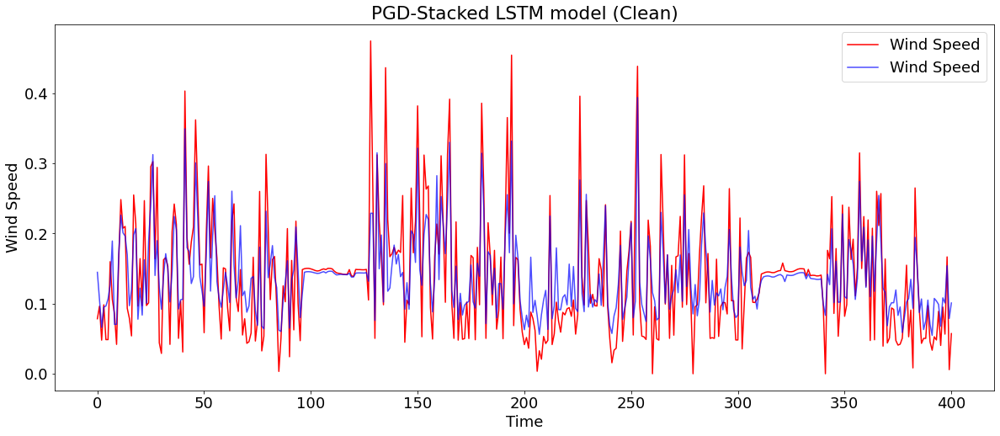

In [75]:
stlstm_pgd_predictions=get_result(pgd_stlstm, X_test, y_test, "PGD-StackedLSTM")
plot_predictions(y_test, stlstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-Stacked LSTM model (Clean)", xLabel="Time" )

Model - PGD-StackedLSTM:
R^2 Score: 0.5010555131766818
RMSE: 0.059365175322151714


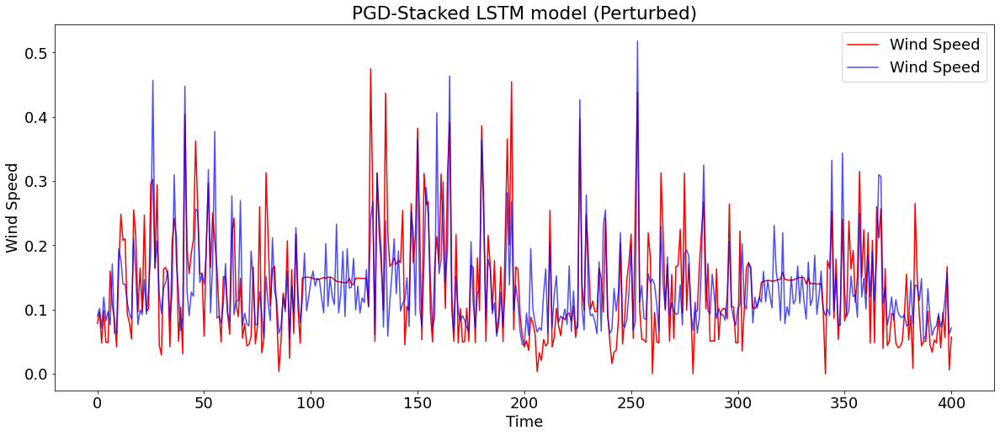

In [76]:
stlstm_pgd_predictions=get_result(pgd_stlstm, X_pgd_perturbed_stlstm, y_test, "PGD-StackedLSTM")
plot_predictions(y_test, stlstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-Stacked LSTM model (Perturbed)", xLabel="Time" )

#### GRU

In [77]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon=0.1)
X_new_gru=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_gru=gru(X_new_gru,new_Y)

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_1 (GRU)                 (None, 40)                5160      
                                                                 
 dropout_18 (Dropout)        (None, 40)                0         
                                                                 
 dense_14 (Dense)            (None, 1)                 41        
                                                                 
Total params: 5,201
Trainable params: 5,201
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
204/204 [==============================] - 3s 8ms/step - loss: 0.0064
Epoch 2/30
204/204 [==============================] - 2s 8ms/step - loss: 0.0046
Epoch 3/30
204/204 [==============================] - 2s 8ms/step - loss: 0.0046
Epoch 4/30
204/204 [==============================] - 2s 8ms/step - loss

Model - FGSM-GRU:
R^2 Score: 0.6136727402295128
RMSE: 0.05223761249046555


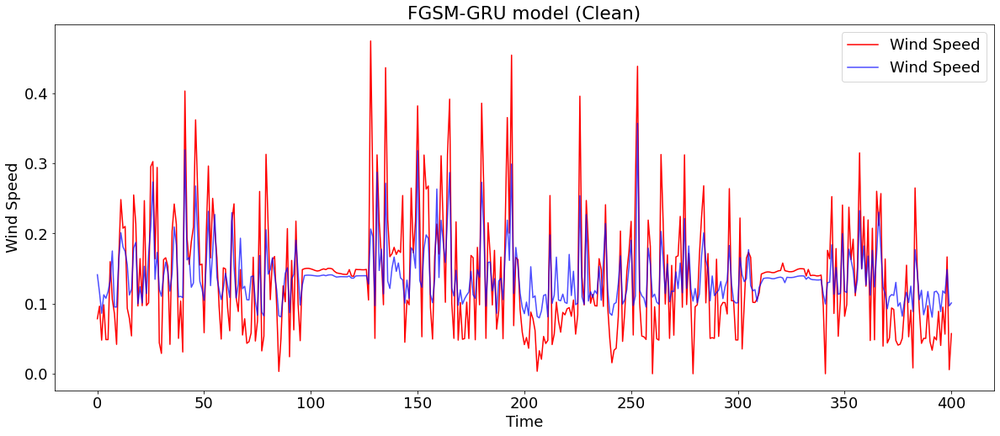

In [78]:
gru_fgsm_predictions=get_result(fgsm_gru, X_test, y_test, "FGSM-GRU")
plot_predictions(y_test, gru_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-GRU model (Clean)", xLabel="Time" )

Model - FGSM-StackedLSTM:
R^2 Score: 0.17651033964847673
RMSE: 0.07626665771776163


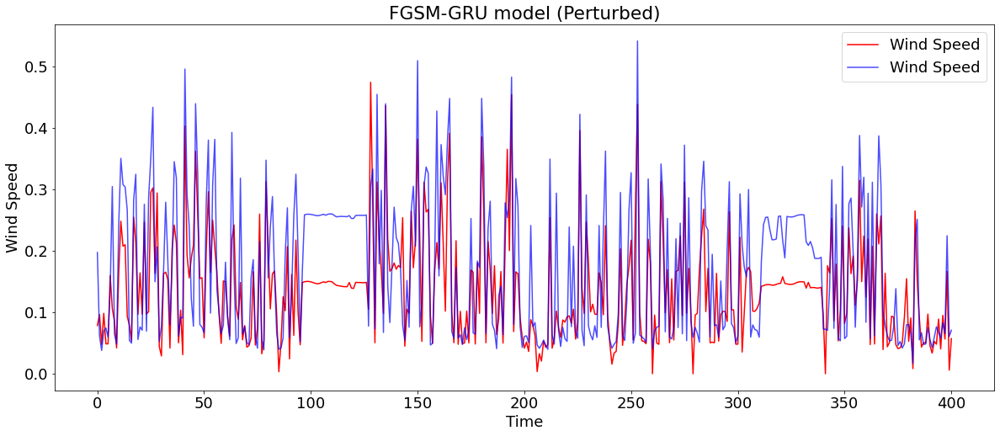

In [79]:
gru_fgsm_predictions=get_result(fgsm_gru, X_fgsm_perturbed_gru, y_test, "FGSM-StackedLSTM")
plot_predictions(y_test, gru_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-GRU model (Perturbed)", xLabel="Time" )


In [80]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,0.1,0.05,X_train, y_train)
X_new_gru=np.concatenate((X_train,X_bim_perturbed_train))
bim_gru=gru(X_new_gru,new_Y)

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_2 (GRU)                 (None, 40)                5160      
                                                                 
 dropout_19 (Dropout)        (None, 40)                0         
                                                                 
 dense_15 (Dense)            (None, 1)                 41        
                                                                 
Total params: 5,201
Trainable params: 5,201
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
204/204 [==============================] - 3s 8ms/step - loss: 0.0058
Epoch 2/30
204/204 [==============================] - 2s 9ms/step - loss: 0.0042
Epoch 3/30
204/204 [==============================] - 2s 9ms/step - loss: 0.0041
Epoch 4/30
204/204 [==============================] - 2s 9ms/step - loss

Model - BIM-GRU:
R^2 Score: 0.7206244471641954
RMSE: 0.044422179631984325


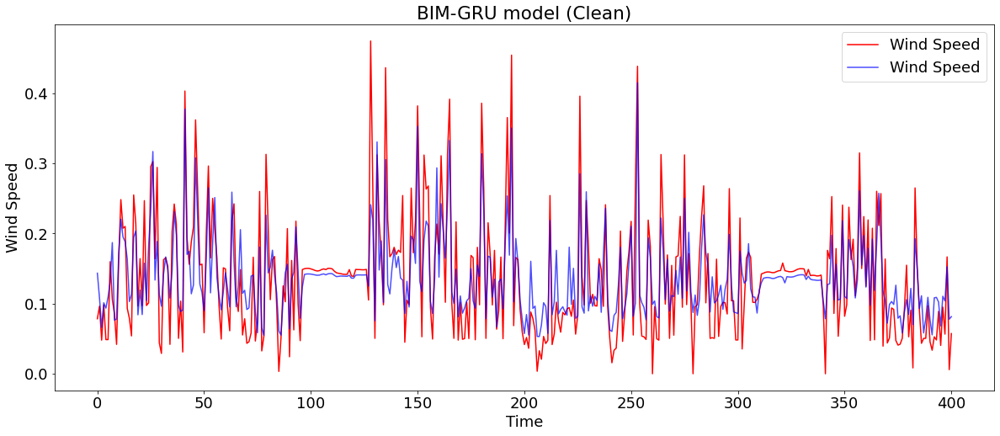

In [81]:
gru_bim_predictions=get_result(bim_gru, X_test, y_test, "BIM-GRU")
plot_predictions(y_test, gru_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-GRU model (Clean)", xLabel="Time" )

Model - BIM-GRU:
R^2 Score: -0.9515269745318546
RMSE: 0.11740670762291455


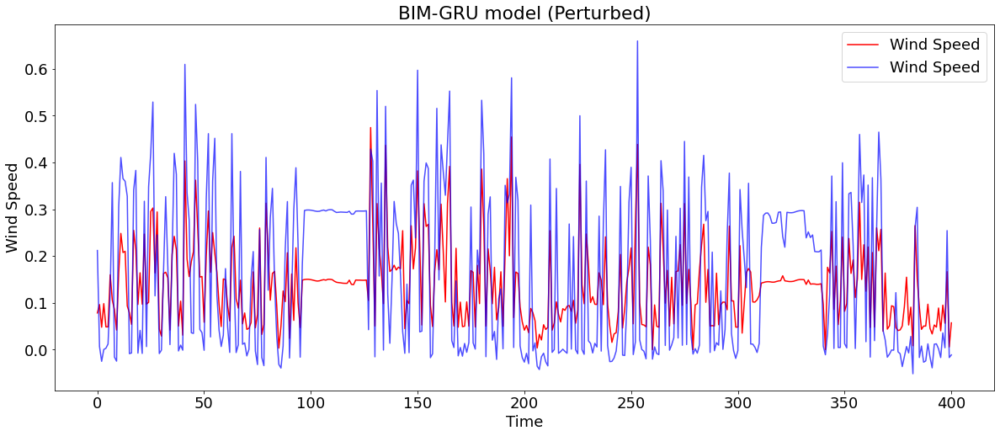

In [82]:
gru_bim_predictions=get_result(bim_gru, X_bim_perturbed_gru, y_test, "BIM-GRU")
plot_predictions(y_test, gru_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-GRU model (Perturbed)", xLabel="Time" )

In [83]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,0.1,0.05,X_train, y_train)
X_new_gru=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_gru=gru(X_new_gru,new_Y)

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_3 (GRU)                 (None, 40)                5160      
                                                                 
 dropout_20 (Dropout)        (None, 40)                0         
                                                                 
 dense_16 (Dense)            (None, 1)                 41        
                                                                 
Total params: 5,201
Trainable params: 5,201
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
204/204 [==============================] - 3s 7ms/step - loss: 0.0057
Epoch 2/30
204/204 [==============================] - 1s 7ms/step - loss: 0.0044
Epoch 3/30
204/204 [==============================] - 1s 7ms/step - loss: 0.0045
Epoch 4/30
204/204 [==============================] - 2s 8ms/step - loss

Model - PGD-GRU:
R^2 Score: 0.6684489057738431
RMSE: 0.048392813492803916


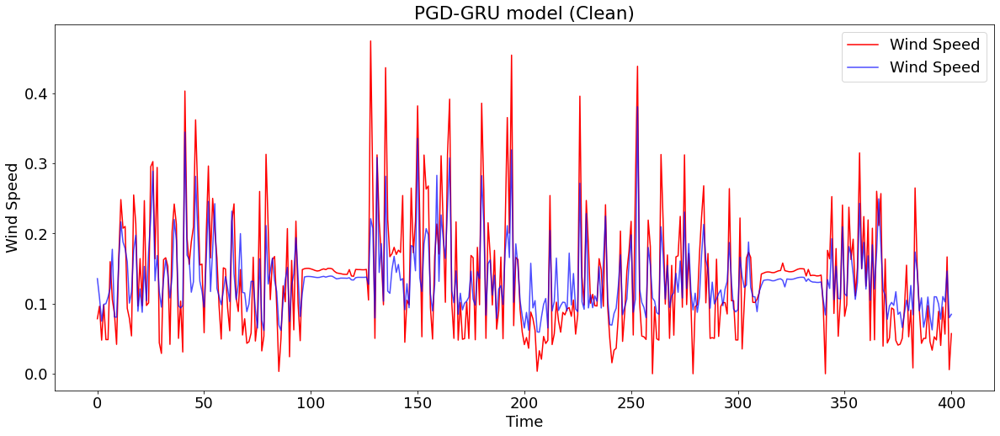

In [84]:
gru_pgd_predictions=get_result(pgd_gru, X_test, y_test, "PGD-GRU")
plot_predictions(y_test, gru_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-GRU model (Clean)", xLabel="Time" )

Model - PGD-GRU:
R^2 Score: 0.2178559165885502
RMSE: 0.07432741755292607


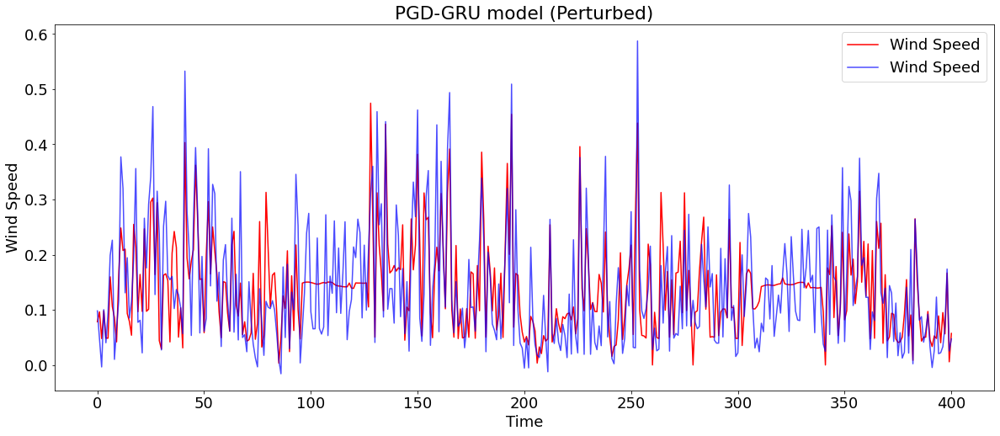

In [85]:
gru_pgd_predictions=get_result(pgd_gru, X_pgd_perturbed_gru, y_test, "PGD-GRU")
plot_predictions(y_test, gru_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-GRU model (Perturbed)", xLabel="Time" )

#### RNN

In [86]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon=0.1)
X_new_rnn=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_rnn=rnn(X_new_rnn,new_Y)

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_1 (SimpleRNN)    (None, 40)                1680      
                                                                 
 dropout_21 (Dropout)        (None, 40)                0         
                                                                 
 dense_17 (Dense)            (None, 1)                 41        
                                                                 
Total params: 1,721
Trainable params: 1,721
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
204/204 [==============================] - 1s 4ms/step - loss: 0.0086
Epoch 2/30
204/204 [==============================] - 1s 3ms/step - loss: 0.0053
Epoch 3/30
204/204 [==============================] - 1s 4ms/step - loss: 0.0049
Epoch 4/30
204/204 [==============================] - 1s 3ms/step - loss

Model - FGSM-RNN:
R^2 Score: 0.601236445409552
RMSE: 0.053071746448662596


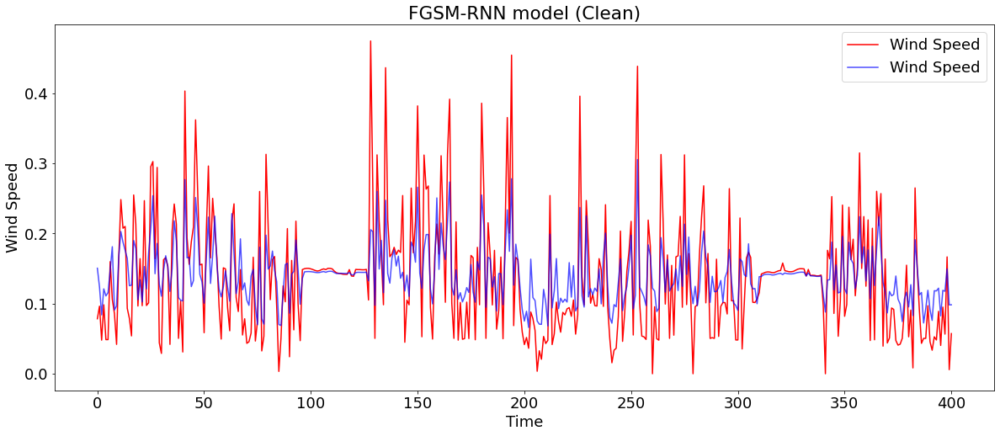

In [87]:
rnn_fgsm_predictions=get_result(fgsm_rnn, X_test, y_test, "FGSM-RNN")
plot_predictions(y_test, rnn_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-RNN model (Clean)", xLabel="Time" )

Model - FGSM-RNN:
R^2 Score: 0.09931386888778737
RMSE: 0.07976132332245948


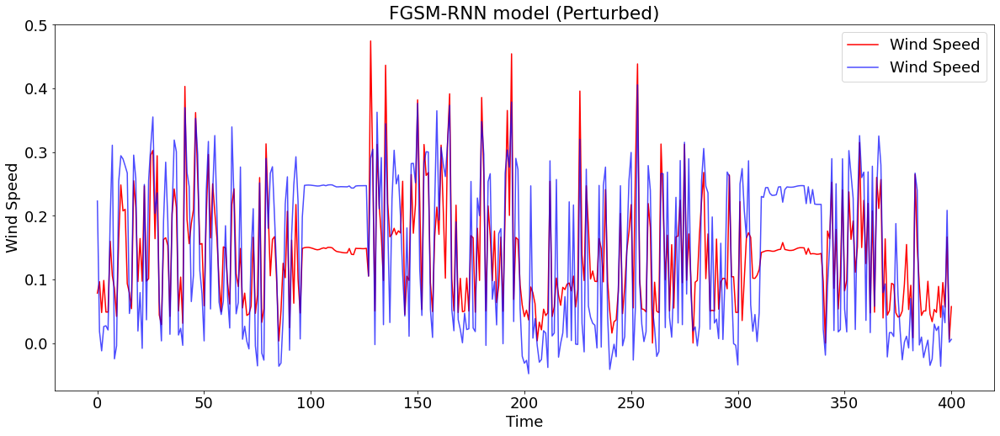

In [88]:
rnn_fgsm_predictions=get_result(fgsm_rnn, X_fgsm_perturbed_rnn, y_test, "FGSM-RNN")
plot_predictions(y_test, rnn_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-RNN model (Perturbed)", xLabel="Time" )

In [89]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,0.1,0.05,X_train, y_train)
X_new_rnn=np.concatenate((X_train,X_bim_perturbed_train))
bim_rnn=rnn(X_new_rnn,new_Y)

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_2 (SimpleRNN)    (None, 40)                1680      
                                                                 
 dropout_22 (Dropout)        (None, 40)                0         
                                                                 
 dense_18 (Dense)            (None, 1)                 41        
                                                                 
Total params: 1,721
Trainable params: 1,721
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
204/204 [==============================] - 1s 3ms/step - loss: 0.0067
Epoch 2/30
204/204 [==============================] - 1s 4ms/step - loss: 0.0046
Epoch 3/30
204/204 [==============================] - 1s 4ms/step - loss: 0.0044
Epoch 4/30
204/204 [==============================] - 1s 4ms/step - loss

Model - BIM-RNN:
R^2 Score: 0.6885237720402216
RMSE: 0.04690488716848496


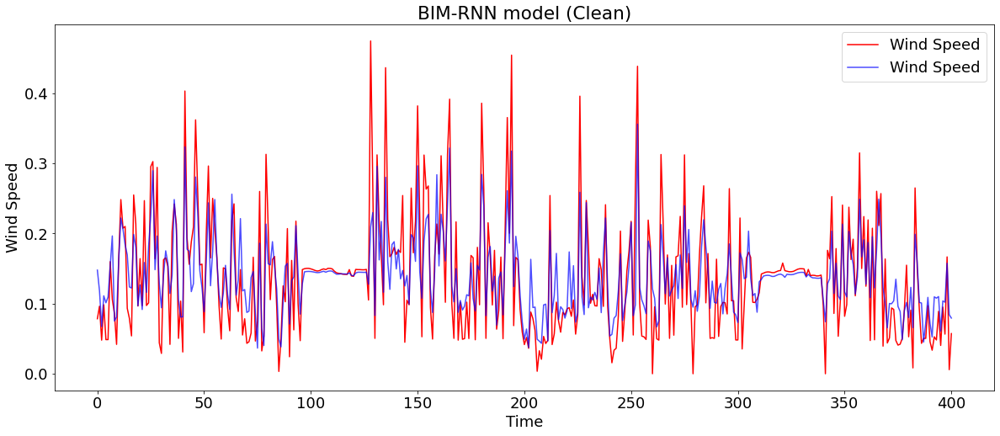

In [90]:
rnn_bim_predictions=get_result(bim_rnn, X_test, y_test, "BIM-RNN")
plot_predictions(y_test, rnn_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-RNN model (Clean)", xLabel="Time" )

Model - BIM-RNN:
R^2 Score: -0.784116194796814
RMSE: 0.1122579767692023


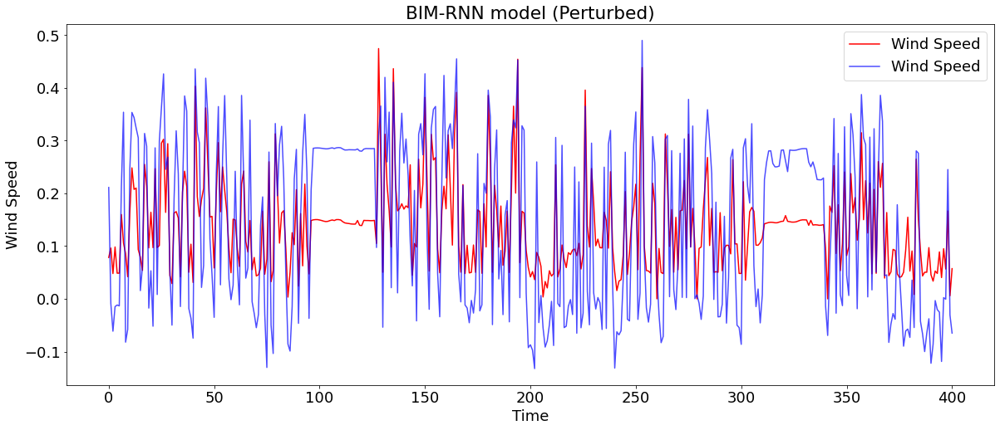

In [91]:
rnn_bim_predictions=get_result(bim_rnn, X_bim_perturbed_rnn, y_test, "BIM-RNN")
plot_predictions(y_test, rnn_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-RNN model (Perturbed)", xLabel="Time" )

In [92]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,0.1,0.05,X_train, y_train)
X_new_rnn=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_rnn=rnn(X_new_rnn,new_Y)

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_3 (SimpleRNN)    (None, 40)                1680      
                                                                 
 dropout_23 (Dropout)        (None, 40)                0         
                                                                 
 dense_19 (Dense)            (None, 1)                 41        
                                                                 
Total params: 1,721
Trainable params: 1,721
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
204/204 [==============================] - 1s 3ms/step - loss: 0.0074
Epoch 2/30
204/204 [==============================] - 1s 4ms/step - loss: 0.0049
Epoch 3/30
204/204 [==============================] - 1s 3ms/step - loss: 0.0047
Epoch 4/30
204/204 [==============================] - 1s 4ms/step - loss

Model - PGD-RNN:
R^2 Score: 0.6668388511031307
RMSE: 0.04851017429919808


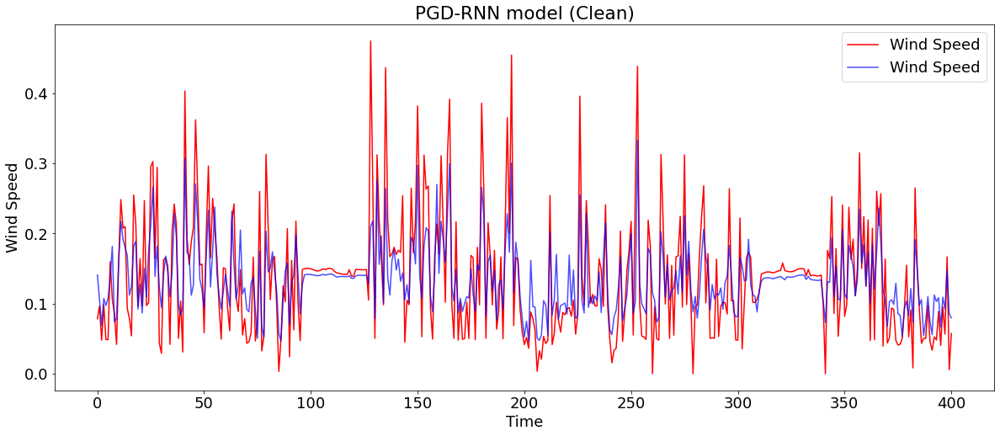

In [93]:
rnn_pgd_predictions=get_result(pgd_rnn, X_test, y_test, "PGD-RNN")
plot_predictions(y_test, rnn_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-RNN model (Clean)", xLabel="Time" )

Model - PGD-RNN:
R^2 Score: -0.036073556082993896
RMSE: 0.08554624226305649


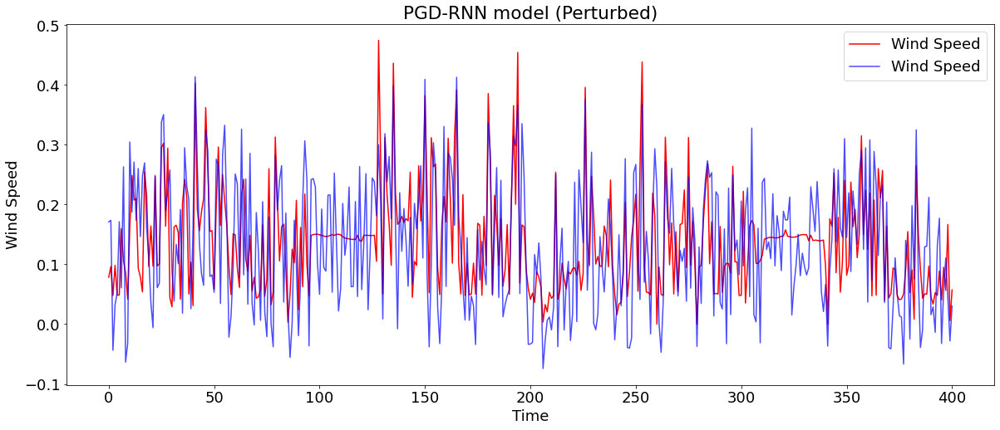

In [94]:
rnn_pgd_predictions=get_result(pgd_rnn, X_pgd_perturbed_rnn, y_test, "PGD-RNN")
plot_predictions(y_test, rnn_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-RNN model (Perturbed)", xLabel="Time" )

#### CNN

In [95]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon=0.1)
X_new_cnn=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_cnn=cnn(X_new_cnn,new_Y)

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_2 (Conv1D)           (None, 22, 64)            192       
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 11, 64)           0         
 1D)                                                             
                                                                 
 flatten_3 (Flatten)         (None, 704)               0         
                                                                 
 dense_20 (Dense)            (None, 10)                7050      
                                                                 
 dense_21 (Dense)            (None, 1)                 11        
                                                                 
Total params: 7,253
Trainable params: 7,253
Non-trainable params: 0
___________________________________________________

Model - FGSM-CNN:
R^2 Score: 0.6905130243144811
RMSE: 0.04675486687613474


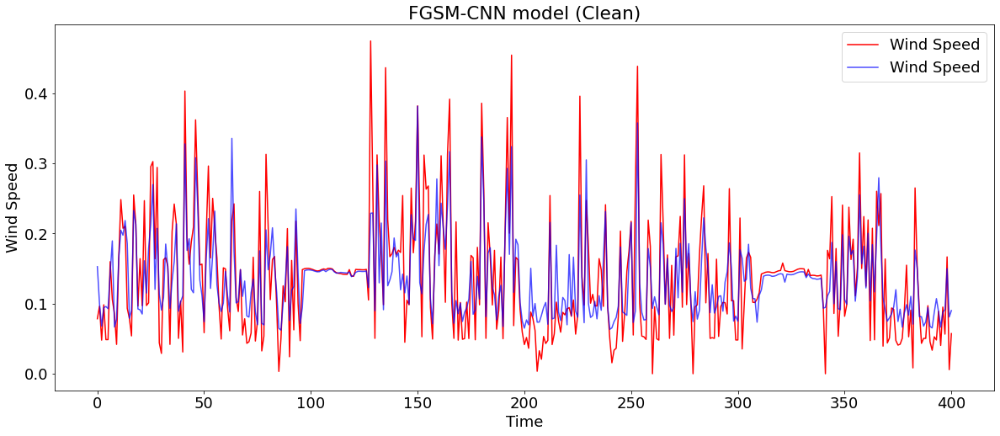

In [96]:
cnn_fgsm_predictions=get_result(fgsm_cnn, X_test, y_test, "FGSM-CNN")
plot_predictions(y_test, cnn_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-CNN model (Clean)", xLabel="Time" )

Model - FGSM-CNN:
R^2 Score: 0.35945693051657324
RMSE: 0.06726355641980228


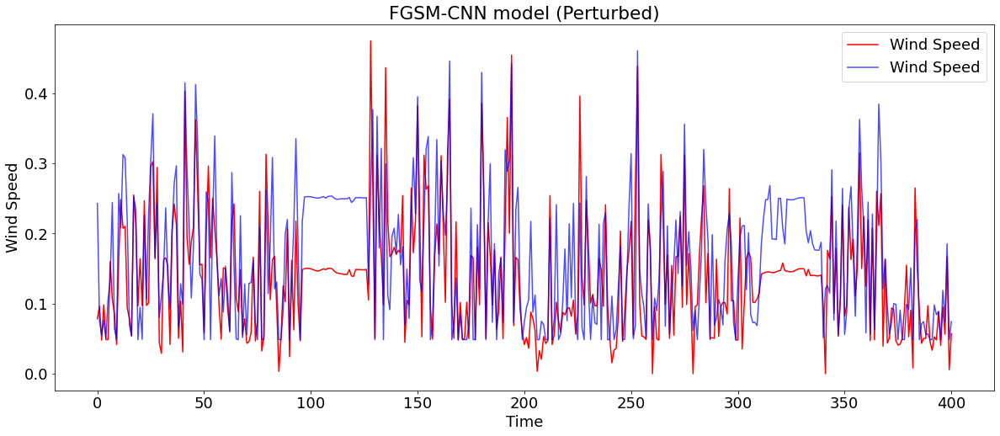

In [97]:
cnn_fgsm_predictions=get_result(fgsm_cnn, X_fgsm_perturbed_cnn, y_test, "FGSM-CNN")
plot_predictions(y_test, cnn_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-CNN model (Perturbed)", xLabel="Time" )

In [98]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,0.1,0.05,X_train, y_train)
X_new_cnn=np.concatenate((X_train,X_bim_perturbed_train))
bim_cnn=cnn(X_new_cnn,new_Y)

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_3 (Conv1D)           (None, 22, 64)            192       
                                                                 
 max_pooling1d_3 (MaxPooling  (None, 11, 64)           0         
 1D)                                                             
                                                                 
 flatten_4 (Flatten)         (None, 704)               0         
                                                                 
 dense_22 (Dense)            (None, 10)                7050      
                                                                 
 dense_23 (Dense)            (None, 1)                 11        
                                                                 
Total params: 7,253
Trainable params: 7,253
Non-trainable params: 0
___________________________________________________

Model - BIM-CNN:
R^2 Score: 0.6866847341669379
RMSE: 0.04704315601189021


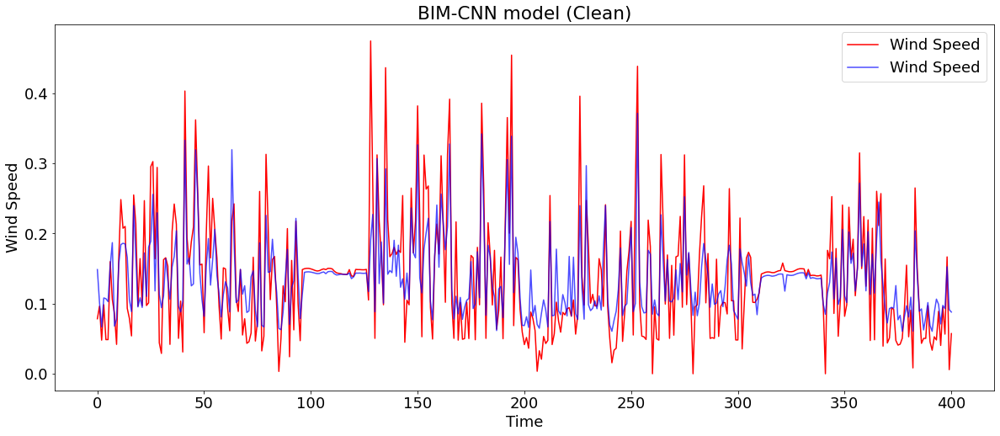

In [99]:
cnn_bim_predictions=get_result(bim_cnn, X_test, y_test, "BIM-CNN")
plot_predictions(y_test, cnn_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-CNN model (Clean)", xLabel="Time" )

Model - BIM-CNN:
R^2 Score: 0.07758583377965589
RMSE: 0.08071767016300321


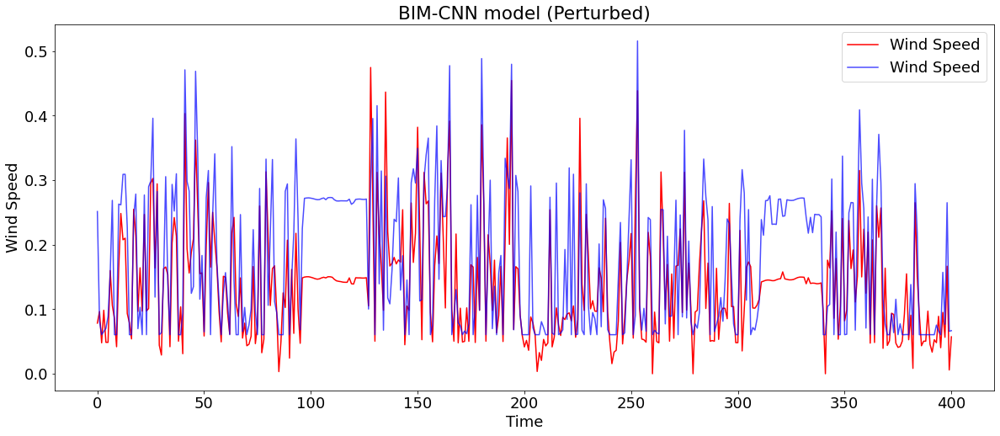

In [100]:
cnn_bim_predictions=get_result(bim_cnn, X_bim_perturbed_cnn, y_test, "BIM-CNN")
plot_predictions(y_test, cnn_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-CNN model (Perturbed)", xLabel="Time" )

In [101]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,0.1,0.05,X_train, y_train)
X_new_cnn=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_cnn=cnn(X_new_cnn,new_Y)

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 22, 64)            192       
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 11, 64)           0         
 1D)                                                             
                                                                 
 flatten_5 (Flatten)         (None, 704)               0         
                                                                 
 dense_24 (Dense)            (None, 10)                7050      
                                                                 
 dense_25 (Dense)            (None, 1)                 11        
                                                                 
Total params: 7,253
Trainable params: 7,253
Non-trainable params: 0
___________________________________________________

Model - PGD-CNN:
R^2 Score: 0.712899269094815
RMSE: 0.0450321611119328


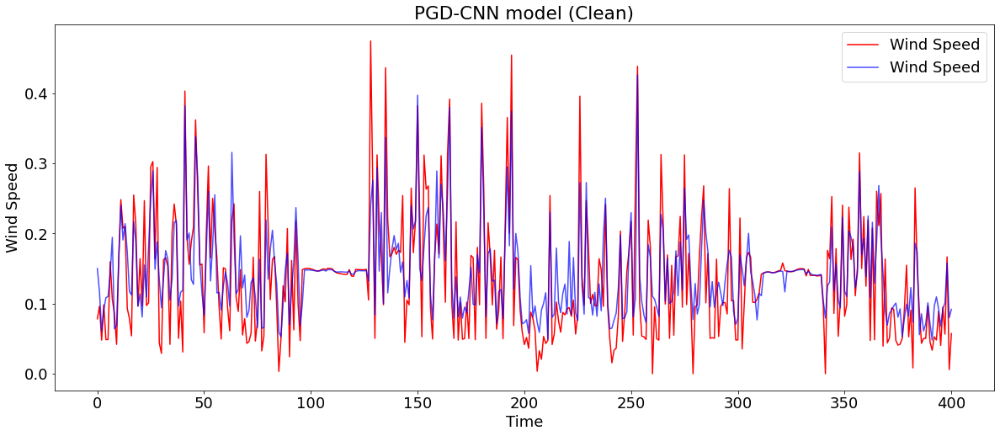

In [102]:
cnn_pgd_predictions=get_result(pgd_cnn, X_test, y_test, "PGD-CNN")
plot_predictions(y_test, cnn_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-CNN model (Clean)", xLabel="Time" )

Model - PGD-CNN:
R^2 Score: 0.014564491218787223
RMSE: 0.08342951914572677


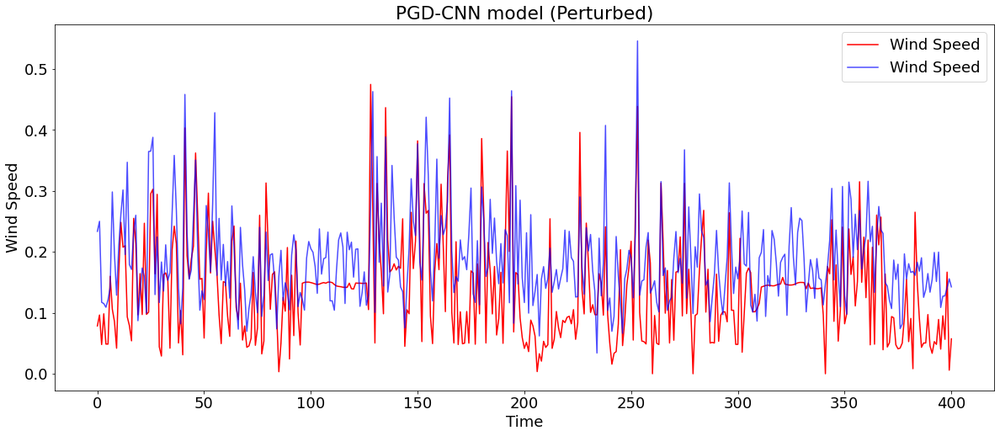

In [103]:
cnn_pgd_predictions=get_result(pgd_cnn, X_pgd_perturbed_cnn, y_test, "PGD-CNN")
plot_predictions(y_test, cnn_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-CNN model (Perturbed)", xLabel="Time" )

#### CNN_LSTM

In [104]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon=0.1)
X_new_cnnlstm=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_cnnlstm=cnn_lstm(X_new_cnnlstm,new_Y)

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_3 (TimeDis  (None, None, 23, 64)     128       
 tributed)                                                       
                                                                 
 time_distributed_4 (TimeDis  (None, None, 11, 64)     0         
 tributed)                                                       
                                                                 
 time_distributed_5 (TimeDis  (None, None, 704)        0         
 tributed)                                                       
                                                                 
 lstm_17 (LSTM)              (None, 20)                58000     
                                                                 
 dense_26 (Dense)            (None, 1)                 21        
                                                     

Model - CNN-LSTM:
R^2 Score: 0.48651436898410483
RMSE: 0.060224029979884776


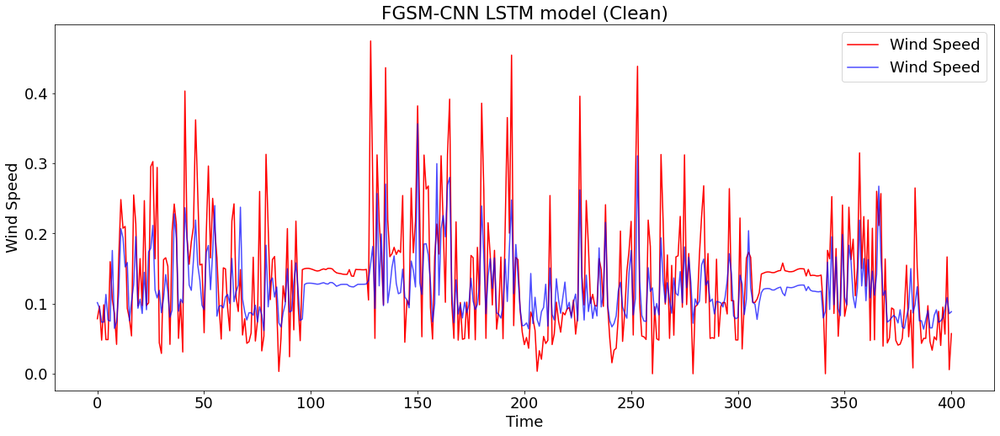

In [105]:
cnnlstm_fgsm_predictions=get_result(fgsm_cnnlstm, X_test.reshape((X_test.shape[0], n_seq, X_test.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-CNN LSTM model (Clean)", xLabel="Time" )

Model - CNN-LSTM:
R^2 Score: 0.4563401686891674
RMSE: 0.06196825689611594


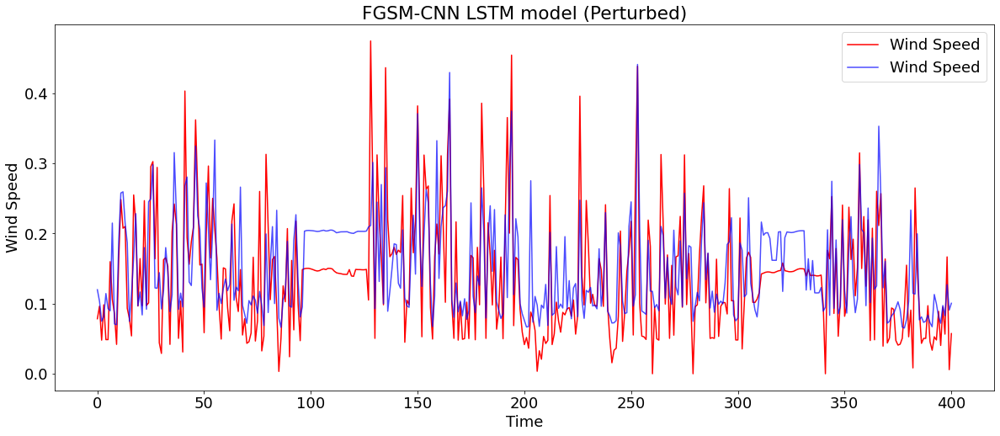

In [106]:
cnnlstm_fgsm_predictions=get_result(fgsm_cnnlstm, X_fgsm_perturbed_cnnlstm.reshape((X_fgsm_perturbed_cnnlstm.shape[0], n_seq, X_bim_perturbed_cnnlstm.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-CNN LSTM model (Perturbed)", xLabel="Time" )

In [107]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,0.1,0.05,X_train, y_train)
X_new_cnnlstm=np.concatenate((X_train,X_bim_perturbed_train))
bim_cnnlstm=cnn_lstm(X_new_cnnlstm,new_Y)

Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_6 (TimeDis  (None, None, 23, 64)     128       
 tributed)                                                       
                                                                 
 time_distributed_7 (TimeDis  (None, None, 11, 64)     0         
 tributed)                                                       
                                                                 
 time_distributed_8 (TimeDis  (None, None, 704)        0         
 tributed)                                                       
                                                                 
 lstm_18 (LSTM)              (None, 20)                58000     
                                                                 
 dense_27 (Dense)            (None, 1)                 21        
                                                     

Model - CNN-LSTM:
R^2 Score: 0.5420399083432252
RMSE: 0.05687474706941997


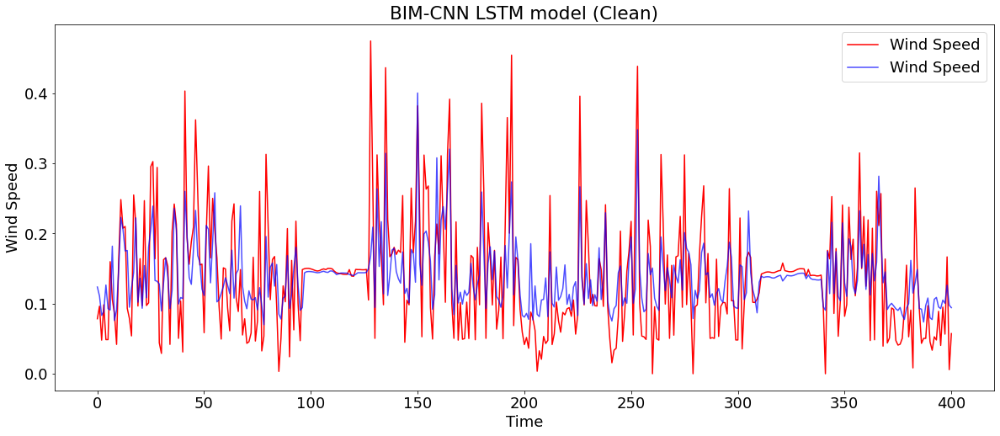

In [108]:
cnnlstm_bim_predictions=get_result(bim_cnnlstm, X_test.reshape((X_test.shape[0], n_seq, X_test.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-CNN LSTM model (Clean)", xLabel="Time" )

Model - CNN-LSTM:
R^2 Score: 0.2531076036187787
RMSE: 0.07263311497179198


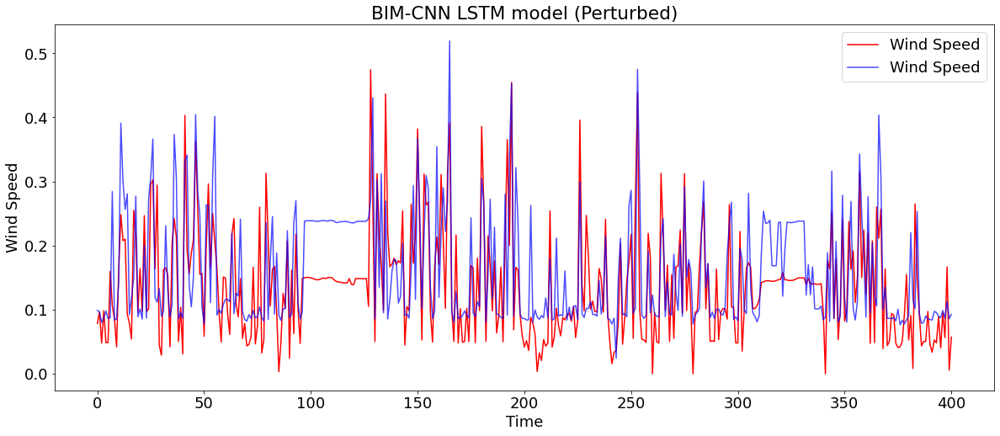

In [109]:
cnnlstm_bim_predictions=get_result(bim_cnnlstm, X_bim_perturbed_cnnlstm.reshape((X_bim_perturbed_cnnlstm.shape[0], n_seq, X_bim_perturbed_cnnlstm.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-CNN LSTM model (Perturbed)", xLabel="Time" )

In [110]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,0.1,0.05,X_train, y_train)
X_new_cnnlstm=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_cnnlstm=cnn_lstm(X_new_cnnlstm,new_Y)

Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_9 (TimeDis  (None, None, 23, 64)     128       
 tributed)                                                       
                                                                 
 time_distributed_10 (TimeDi  (None, None, 11, 64)     0         
 stributed)                                                      
                                                                 
 time_distributed_11 (TimeDi  (None, None, 704)        0         
 stributed)                                                      
                                                                 
 lstm_19 (LSTM)              (None, 20)                58000     
                                                                 
 dense_28 (Dense)            (None, 1)                 21        
                                                     

Model - CNN-LSTM:
R^2 Score: 0.5256215177799515
RMSE: 0.057885279707909354


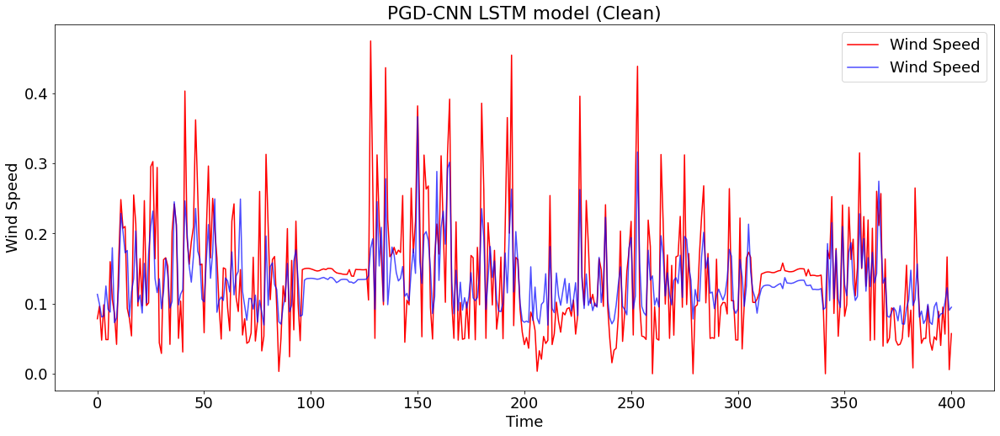

In [111]:
cnnlstm_pgd_predictions=get_result(pgd_cnnlstm, X_test.reshape((X_test.shape[0], n_seq, X_test.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-CNN LSTM model (Clean)", xLabel="Time" )

Model - CNN-LSTM:
R^2 Score: 0.37744048982186784
RMSE: 0.06631260467893156


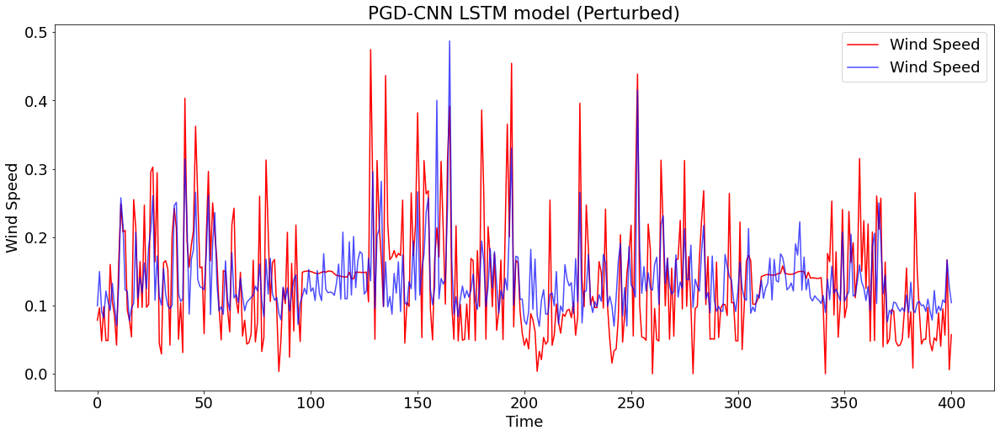

In [112]:
cnnlstm_pgd_predictions=get_result(pgd_cnnlstm, X_pgd_perturbed_cnnlstm.reshape((X_pgd_perturbed_cnnlstm.shape[0], n_seq, X_pgd_perturbed_cnnlstm.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-CNN LSTM model (Perturbed)", xLabel="Time"  )

#### ConvLSTM

In [113]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon=0.1)
X_new_convlstm=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_convlstm=convlstm(X_new_convlstm,new_Y)

Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_1 (ConvLSTM2D)  (None, 1, 22, 64)         33536     
                                                                 
 flatten_9 (Flatten)         (None, 1408)              0         
                                                                 
 dense_29 (Dense)            (None, 1)                 1409      
                                                                 
Total params: 34,945
Trainable params: 34,945
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
204/204 [==============================] - 3s 5ms/step - loss: 0.0074
Epoch 2/30
204/204 [==============================] - 1s 5ms/step - loss: 0.0045
Epoch 3/30
204/204 [==============================] - 1s 5ms/step - loss: 0.0042
Epoch 4/30
204/204 [==============================] - 1s 5ms/step - lo

Model - ConvLSTM:
R^2 Score: 0.6286307393188788
RMSE: 0.05121634994859975


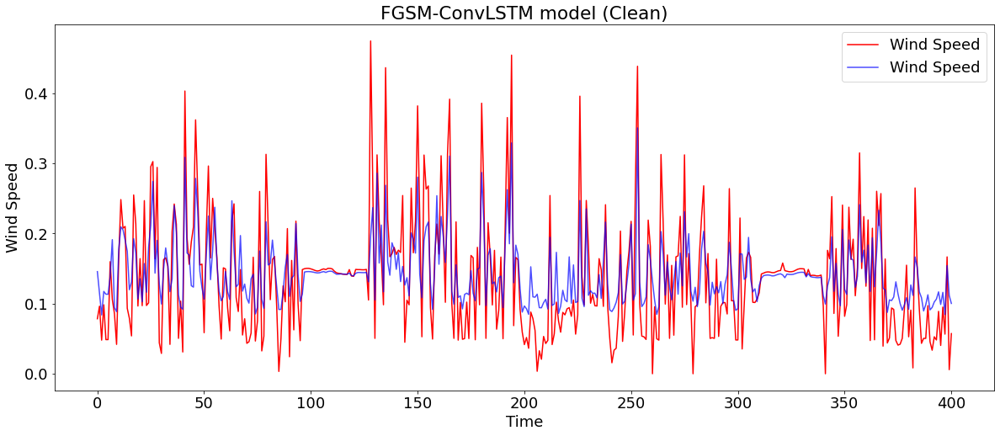

In [114]:
convlstm_fgsm_predictions=get_result(fgsm_convlstm, X_test.reshape((X_test.shape[0], n_seq,1, X_test.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-ConvLSTM model (Clean)", xLabel="Time" )

Model - ConvLSTM:
R^2 Score: 0.11244973666042413
RMSE: 0.07917756091415762


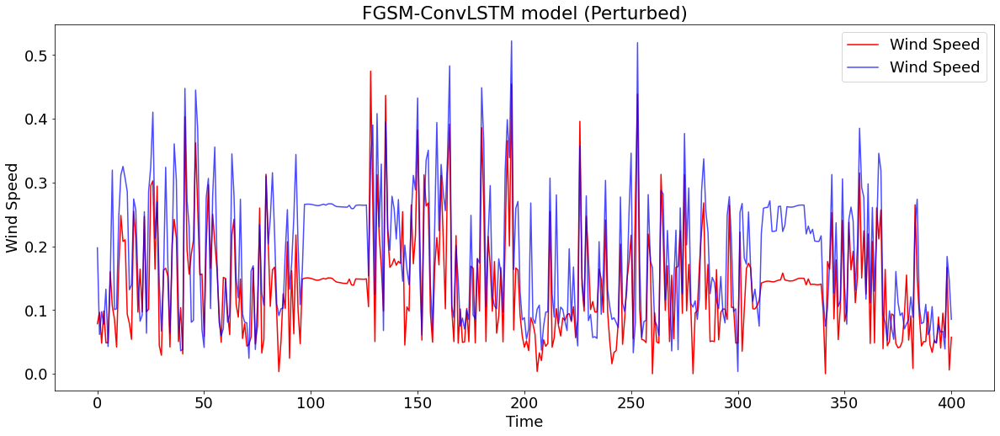

In [115]:
convlstm_fgsm_predictions=get_result(fgsm_convlstm, X_fgsm_perturbed_convlstm.reshape((X_fgsm_perturbed_convlstm.shape[0], n_seq,1, X_bim_perturbed_convlstm.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-ConvLSTM model (Perturbed)", xLabel="Time" )

In [116]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,0.1,0.05,X_train, y_train)
X_new_convlstm=np.concatenate((X_train,X_bim_perturbed_train))
bim_convlstm=convlstm(X_new_convlstm,new_Y)

Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_2 (ConvLSTM2D)  (None, 1, 22, 64)         33536     
                                                                 
 flatten_10 (Flatten)        (None, 1408)              0         
                                                                 
 dense_30 (Dense)            (None, 1)                 1409      
                                                                 
Total params: 34,945
Trainable params: 34,945
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
204/204 [==============================] - 3s 5ms/step - loss: 0.0068
Epoch 2/30
204/204 [==============================] - 1s 5ms/step - loss: 0.0041
Epoch 3/30
204/204 [==============================] - 1s 5ms/step - loss: 0.0039
Epoch 4/30
204/204 [==============================] - 1s 5ms/step - lo

Model - ConvLSTM:
R^2 Score: 0.6721627180890439
RMSE: 0.04812101966170336


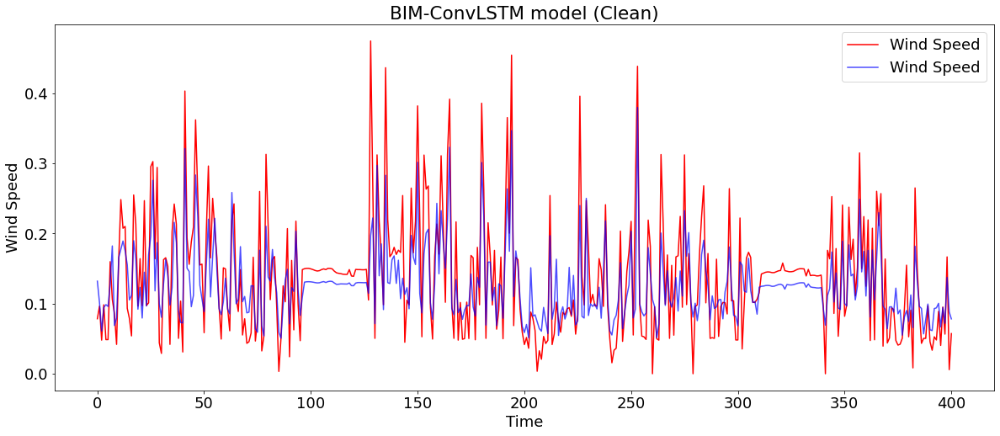

In [117]:
convlstm_bim_predictions=get_result(bim_convlstm, X_test.reshape((X_test.shape[0], n_seq,1, X_test.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-ConvLSTM model (Clean)", xLabel="Time" )

Model - ConvLSTM:
R^2 Score: -0.44674454273468456
RMSE: 0.10108846296844938


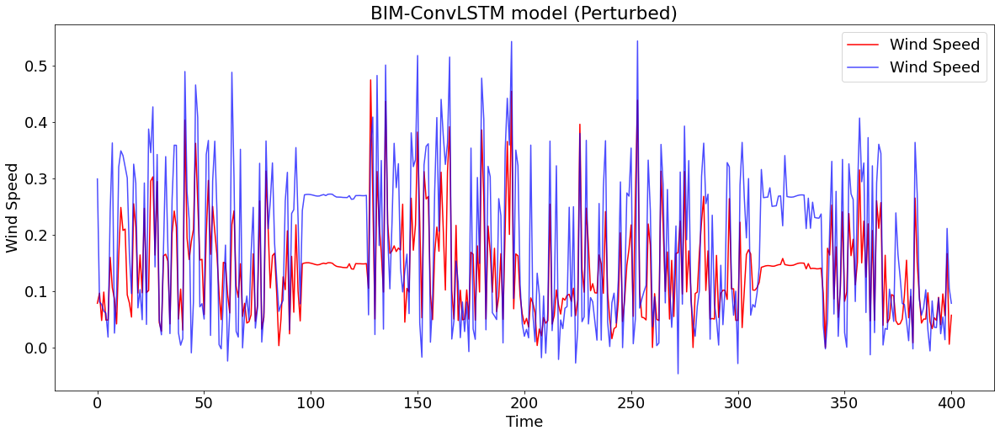

In [118]:
convlstm_bim_predictions=get_result(bim_convlstm, X_bim_perturbed_convlstm.reshape((X_bim_perturbed_convlstm.shape[0], n_seq,1, X_bim_perturbed_convlstm.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-ConvLSTM model (Perturbed)", xLabel="Time" )

In [119]:
X_pgd_perturbed_train = pgd(5,0.1,0.05,X_train, y_train)
X_new_convlstm=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_convlstm=convlstm(X_new_convlstm,new_Y)

Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_3 (ConvLSTM2D)  (None, 1, 22, 64)         33536     
                                                                 
 flatten_11 (Flatten)        (None, 1408)              0         
                                                                 
 dense_31 (Dense)            (None, 1)                 1409      
                                                                 
Total params: 34,945
Trainable params: 34,945
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
204/204 [==============================] - 3s 5ms/step - loss: 0.0074
Epoch 2/30
204/204 [==============================] - 1s 5ms/step - loss: 0.0044
Epoch 3/30
204/204 [==============================] - 1s 5ms/step - loss: 0.0041
Epoch 4/30
204/204 [==============================] - 1s 5ms/step - lo

Model - ConvLSTM:
R^2 Score: 0.7006230090441964
RMSE: 0.04598485896513353


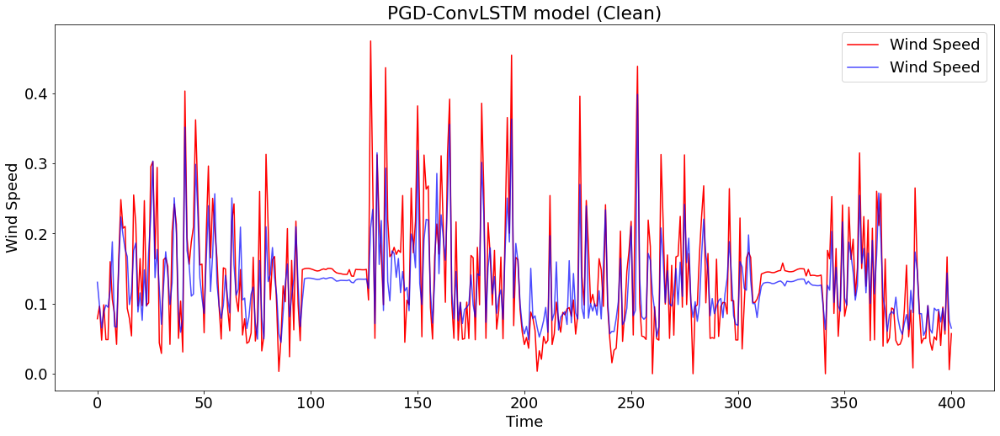

In [120]:
convlstm_pgd_predictions=get_result(pgd_convlstm, X_test.reshape((X_test.shape[0], n_seq,1, X_test.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-ConvLSTM model (Clean)", xLabel="Time" )

Model - ConvLSTM:
R^2 Score: -0.04025516270040619
RMSE: 0.08571870271488127


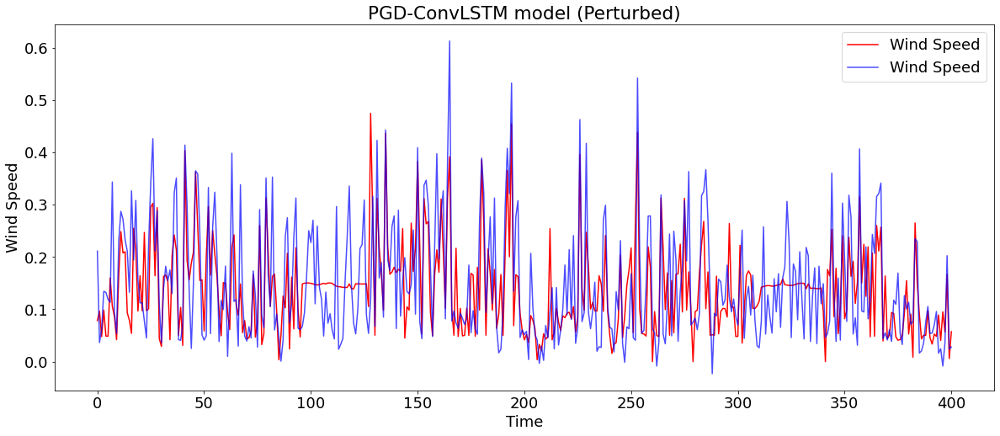

In [121]:
convlstm_pgd_predictions=get_result(pgd_convlstm, X_pgd_perturbed_convlstm.reshape((X_pgd_perturbed_convlstm.shape[0], n_seq,1, X_pgd_perturbed_convlstm.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-ConvLSTM model (Perturbed)", xLabel="Time" )